In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Input
from tensorflow.keras.optimizers import Adam
from transformers import pipeline

In [ ]:
def get_stock_data(ticker):
    stock = yf.Ticker(ticker)
    data = stock.history(period="5y")

    # Technical indicators
    data['RSI'] = data['Close'].diff().apply(lambda x: max(x, 0)).rolling(14).mean() / \
                  data['Close'].diff().abs().rolling(14).mean()
    data['Stochastic'] = ((data['Close'] - data['Low'].rolling(14).min()) / \
                          (data['High'].rolling(14).max() - data['Low'].rolling(14).min())) * 100
    data['ROC'] = data['Close'].pct_change(periods=10) * 100
    data['ADX'] = abs(data['High'] - data['Low']).rolling(14).mean()

    data.fillna(0, inplace=True)
    return data

In [ ]:
def get_news_sentiment(ticker):
    finbert = pipeline("sentiment-analysis", model="ProsusAI/finbert")
    sentiment_scores = [finbert("positive news about stock")[0]['score'] for _ in range(10)]
    return np.mean(sentiment_scores) if sentiment_scores else 0

In [ ]:
def prepare_data(data, sentiment_score, time_step=10):
    features = ['Close', 'RSI', 'Stochastic', 'ROC', 'ADX']
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data[features])

    X, Y = [], []
    for i in range(len(data_scaled) - time_step):
        x_features = np.hstack([data_scaled[i:i+time_step], np.full((time_step, 1), sentiment_score)])
        X.append(x_features)
        Y.append(data_scaled[i+time_step, 0])  # Predict only the closing price

    return np.array(X), np.array(Y).reshape(-1, 1), scaler  # Ensure Y is 2D

In [ ]:
# LSTM Model
def build_lstm_model(time_step, features):
    model = Sequential([
        Input(shape=(time_step, features)),
        LSTM(64, return_sequences=True),
        LSTM(64, return_sequences=False),
        Dense(32, activation='relu'),
        Dense(1)  # Single output for stock price prediction
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model


Processing RELIANCE.NS...


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - loss: 0.0510 - val_loss: 8.5236e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 8.0267e-04 - val_loss: 0.0011
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 7.4733e-04 - val_loss: 6.3472e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 5.9641e-04 - val_loss: 6.2987e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 6.8671e-04 - val_loss: 0.0020
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0015 - val_loss: 6.3138e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 6.5732e-04 - val_loss: 6.5885e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 6.2754e-04 - val_loss: 4.3005e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 5.4535e-04 - val_loss: 5.9975e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 5.9534e-04 - val_loss: 4.9306e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step
RELIANCE.NS - MAE: 13.805580405742132, MSE: 35

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


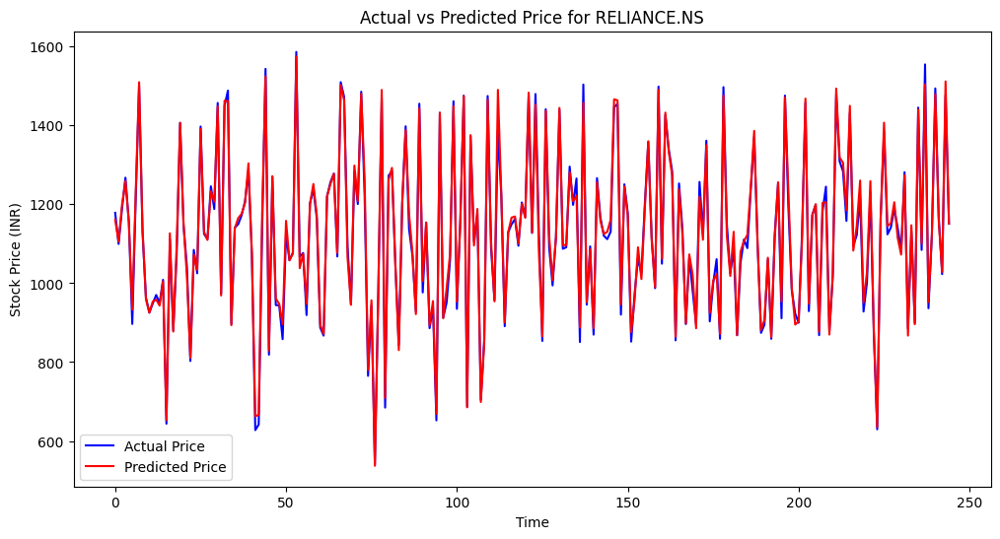


Processing TCS.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.0489 - val_loss: 9.2608e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0012 - val_loss: 9.2916e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 8.3846e-04 - val_loss: 6.4839e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 8.3962e-04 - val_loss: 7.7002e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 8.7230e-04 - val_loss: 8.3962e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 7.7626e-04 - val_loss: 6.1732e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 6.7109e-04 - val_loss: 6.5040e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 8.8813e-04 - val_loss: 4.7519e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 6.6576e-04 - val_loss: 8.7916e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 7.1864e-04 - val_loss: 4.3219e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step
TCS.NS - MAE: 32.74687826070134, MSE: 2

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


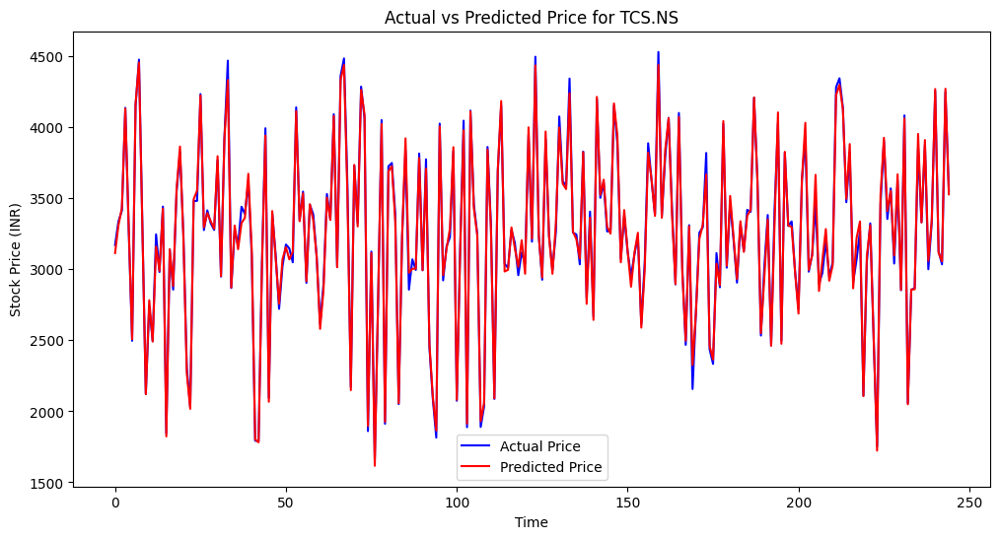


Processing HDFCBANK.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0829 - val_loss: 0.0014
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0018 - val_loss: 0.0014
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0019 - val_loss: 9.7714e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0014 - val_loss: 8.9187e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0013 - val_loss: 8.4923e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0013 - val_loss: 8.6434e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0010 - val_loss: 0.0014
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0014 - val_loss: 7.8236e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 9.8158e-04 - val_loss: 0.0016
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0011 - val_loss: 0.0013
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step
HDFCBANK.NS - MAE: 18.45107742076067, MSE: 602.8556398558468, RMSE: 24.553118739904445,

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


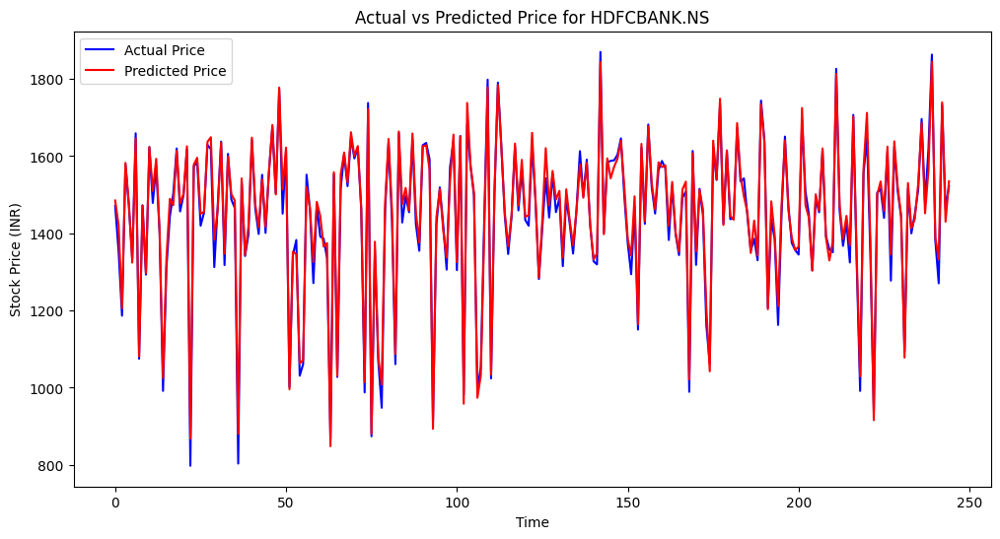


Processing INFY.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1517 - val_loss: 0.0029
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0010 - val_loss: 9.6720e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 8.0496e-04 - val_loss: 0.0024
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0011 - val_loss: 0.0013
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 9.8404e-04 - val_loss: 0.0011
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.7928e-04 - val_loss: 7.1209e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 6.8383e-04 - val_loss: 7.2663e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 6.7485e-04 - val_loss: 6.3574e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 6.0510e-04 - val_loss: 8.6902e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step
INFY.NS - MAE: 20.16836050445616, MSE: 781.7819987913031, RMSE: 27.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


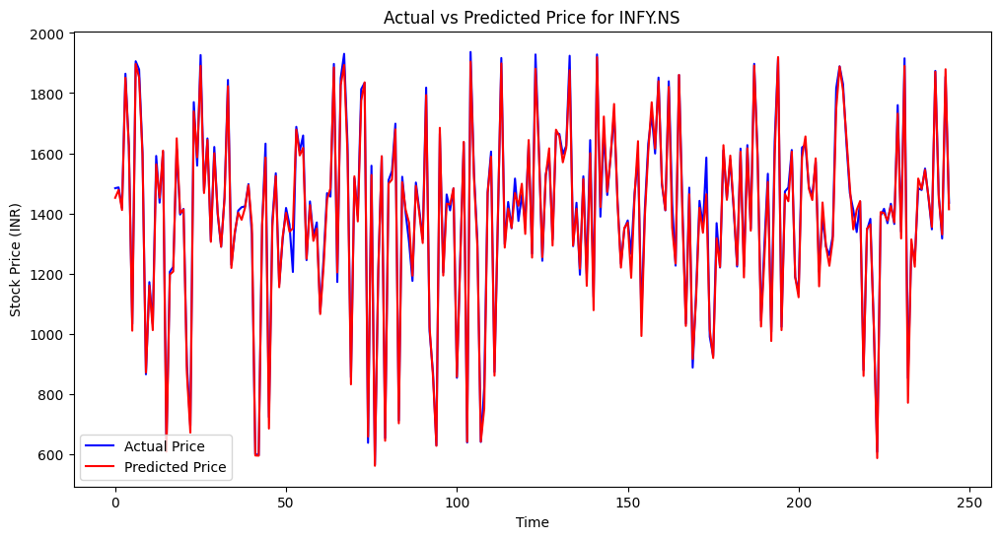


Processing HINDUNILVR.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.0996 - val_loss: 0.0060
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0038 - val_loss: 0.0021
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0023 - val_loss: 0.0016
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0020 - val_loss: 0.0015
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0019 - val_loss: 0.0013
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0019 - val_loss: 0.0025
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0020 - val_loss: 0.0024
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0016 - val_loss: 0.0011
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step
HINDUNILVR.NS - MAE: 23.98217802389649, MSE: 1016.4615318877496, RMSE: 31.881993850569472, R2 Score: 0.97921910

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


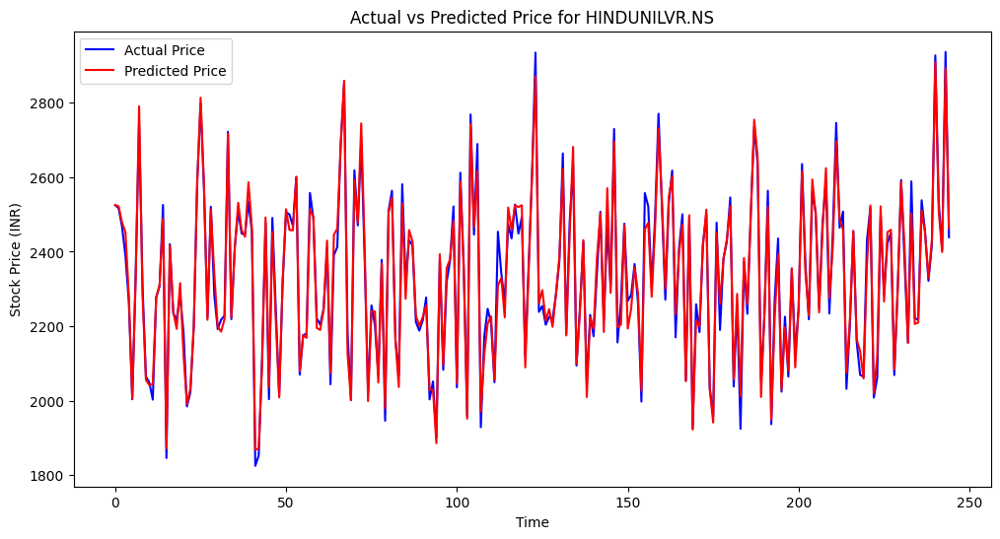


Processing ICICIBANK.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0714 - val_loss: 9.5118e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 6.9108e-04 - val_loss: 4.1559e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 4.4467e-04 - val_loss: 6.8771e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 5.9245e-04 - val_loss: 6.3972e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.0589e-04 - val_loss: 8.3376e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 4.1131e-04 - val_loss: 3.1755e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 3.4051e-04 - val_loss: 3.9514e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 3.9665e-04 - val_loss: 3.0377e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 3.1319e-04 - val_loss: 3.8326e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 2.7944e-04 - val_loss: 3.1782e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step
ICICIBANK.NS - MAE: 10.436715452953

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


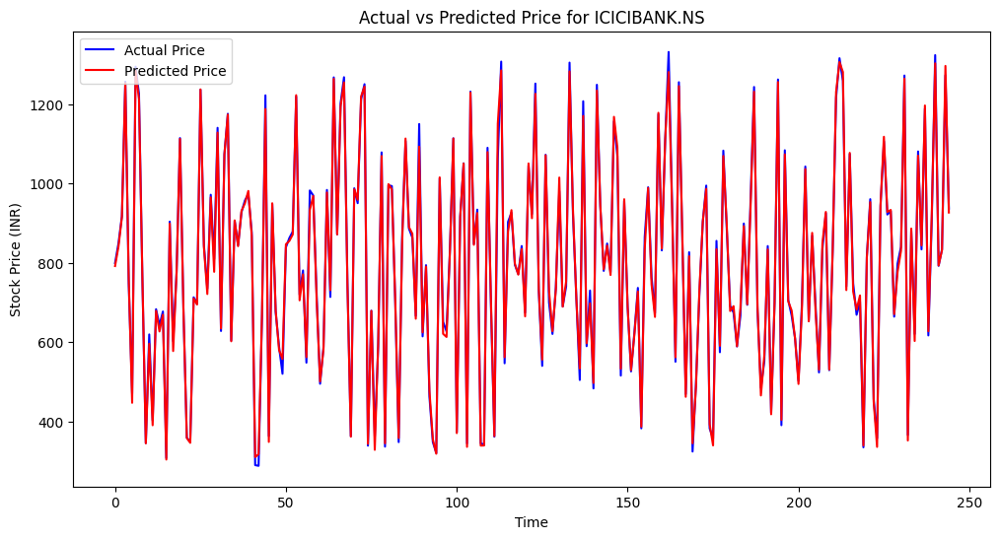


Processing BHARTIARTL.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 0.0338 - val_loss: 8.0507e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 7.1433e-04 - val_loss: 4.0023e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 3.5733e-04 - val_loss: 4.1341e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 4.9537e-04 - val_loss: 3.1804e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 4.8564e-04 - val_loss: 1.9522e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 2.8151e-04 - val_loss: 3.0852e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 3.2292e-04 - val_loss: 3.0711e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 3.2105e-04 - val_loss: 8.9350e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 7.9543e-04 - val_loss: 2.2406e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 4.0584e-04 - val_loss: 2.0476e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step
BHARTIARTL.NS - MAE: 10.65541487687

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


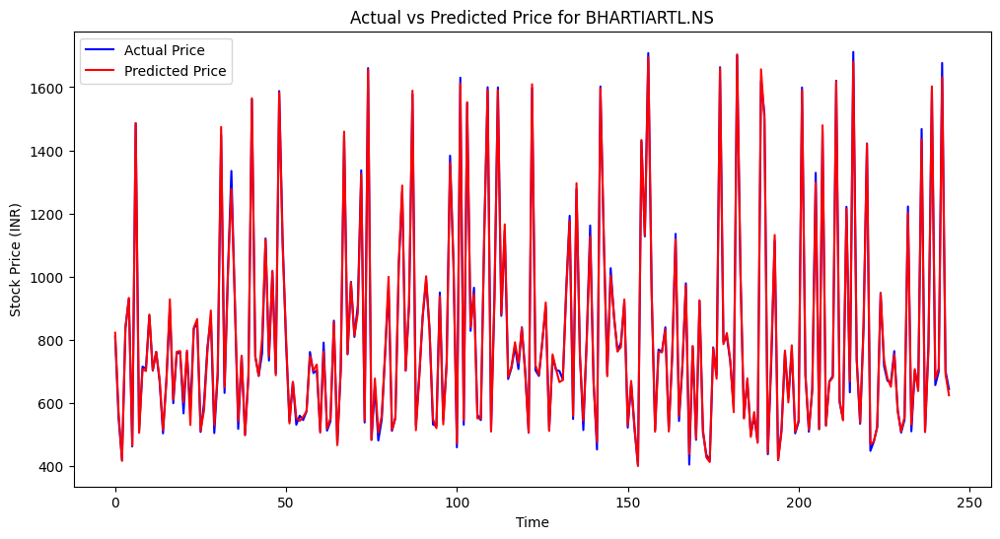


Processing KOTAKBANK.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.1168 - val_loss: 0.0050
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0042 - val_loss: 0.0020
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0025 - val_loss: 0.0016
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0023 - val_loss: 0.0014
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0029 - val_loss: 0.0013
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0021 - val_loss: 0.0013
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0022 - val_loss: 0.0039
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0018 - val_loss: 0.0011
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step
KOTAKBANK.NS - MAE: 21.759765604849896, MSE: 792.9088028133182, RMSE: 28.1586363805728, R2 Score: 0.97604106121

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


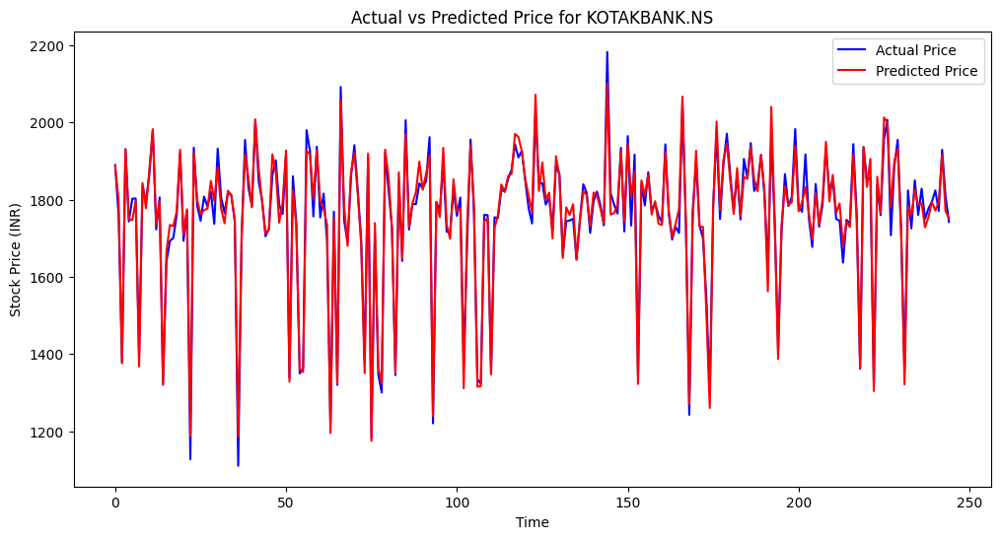


Processing ITC.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0663 - val_loss: 8.2432e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 7.0402e-04 - val_loss: 4.4663e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 5.0359e-04 - val_loss: 3.9402e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 4.9735e-04 - val_loss: 7.9338e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 5.2583e-04 - val_loss: 0.0010
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 4.7288e-04 - val_loss: 8.4819e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 5.8562e-04 - val_loss: 6.5559e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 4.6133e-04 - val_loss: 3.9271e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 4.3630e-04 - val_loss: 6.6593e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 5.1299e-04 - val_loss: 2.9514e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step
ITC.NS - MAE: 3.1941718590581267, MSE: 

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


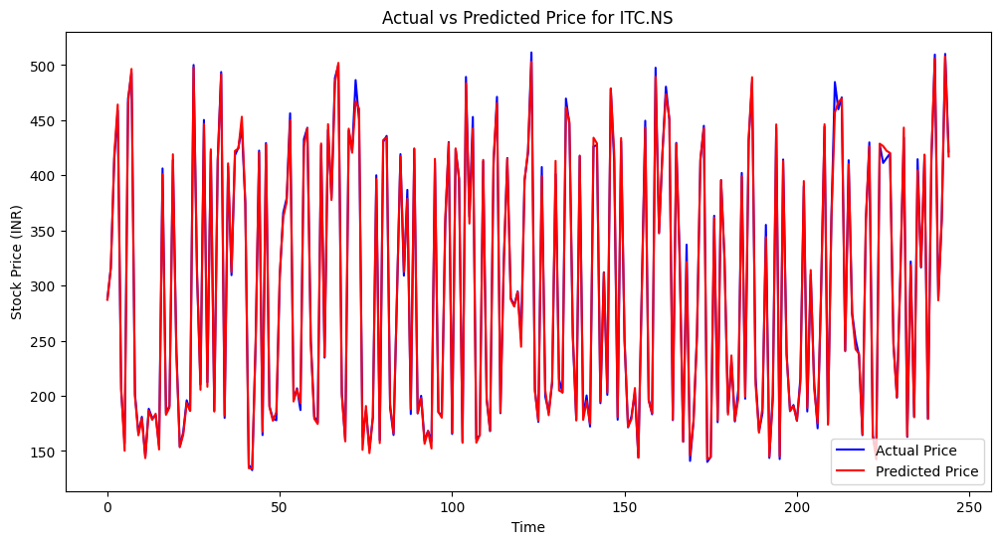


Processing SBIN.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 0.0729 - val_loss: 0.0013
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 9.4340e-04 - val_loss: 7.9065e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 5.1772e-04 - val_loss: 5.5944e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 7.1910e-04 - val_loss: 5.0808e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 4.8504e-04 - val_loss: 4.1925e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 4.6634e-04 - val_loss: 8.4033e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 5.1701e-04 - val_loss: 7.2544e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 7.0864e-04 - val_loss: 4.0795e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 4.7832e-04 - val_loss: 8.7407e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 5.9135e-04 - val_loss: 7.1252e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
SBIN.NS - MAE: 9.287373476804927, MSE: 

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


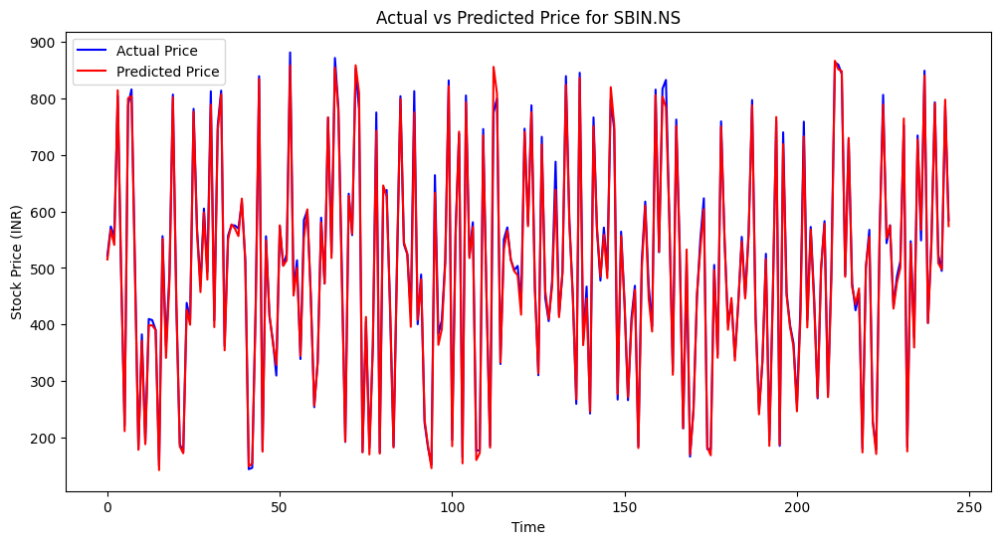


Processing LT.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0599 - val_loss: 7.4179e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 9.5801e-04 - val_loss: 4.7034e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 5.4175e-04 - val_loss: 4.1915e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 4.0687e-04 - val_loss: 5.7752e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 4.7996e-04 - val_loss: 5.5149e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 3.6952e-04 - val_loss: 4.4001e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 5.0240e-04 - val_loss: 3.6246e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 3.4955e-04 - val_loss: 4.5608e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 3.8992e-04 - val_loss: 3.6560e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 4.2105e-04 - val_loss: 3.3607e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step
LT.NS - MAE: 32.051619127855794, MS

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


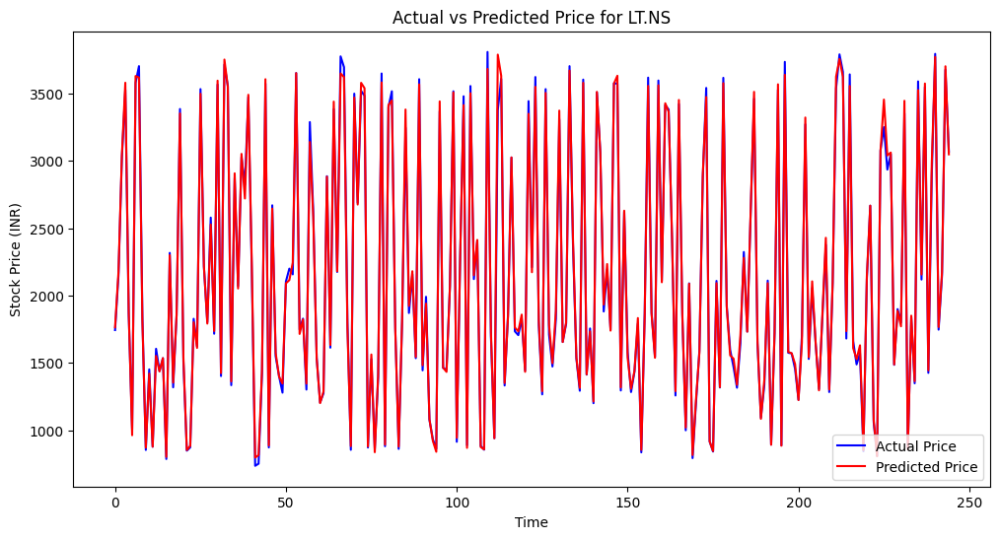


Processing AXISBANK.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0415 - val_loss: 7.4136e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0013 - val_loss: 6.7879e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 9.1545e-04 - val_loss: 9.5253e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 8.0487e-04 - val_loss: 0.0011
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 9.4607e-04 - val_loss: 5.1580e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 7.3597e-04 - val_loss: 0.0016
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 7.3386e-04 - val_loss: 5.4549e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 5.1495e-04 - val_loss: 0.0013
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0013 - val_loss: 5.9293e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 5.3941e-04 - val_loss: 8.1954e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
AXISBANK.NS - MAE: 13.957320693806178, MSE: 335.7819700

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


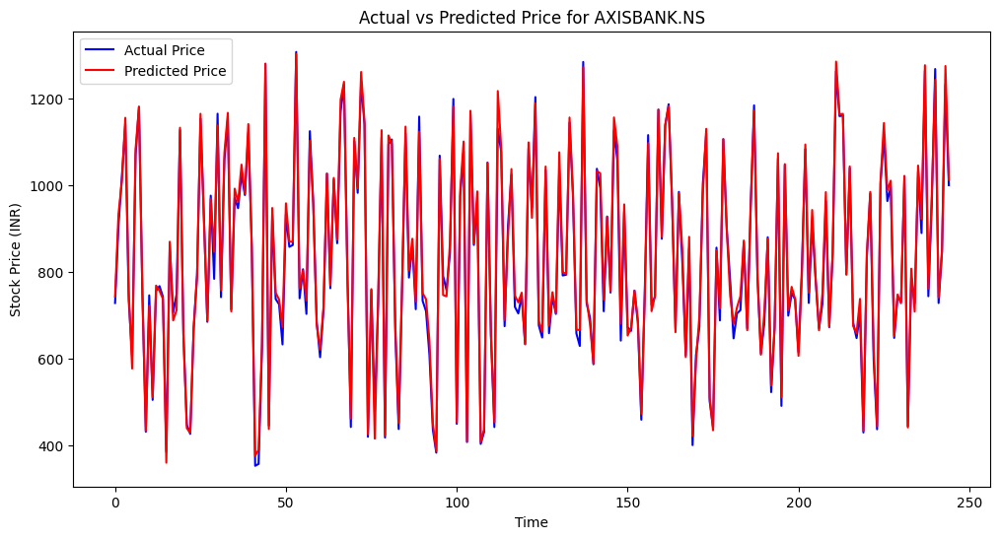


Processing BAJFINANCE.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.1132 - val_loss: 0.0020
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0012 - val_loss: 0.0014
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0011 - val_loss: 0.0013
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0013 - val_loss: 0.0012
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0011 - val_loss: 0.0017
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 8.5647e-04 - val_loss: 0.0014
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0012 - val_loss: 8.7221e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 8.9258e-04 - val_loss: 8.9567e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step
BAJFINANCE.NS - MAE: 102.10179394526367, MSE: 18741.20340670754, RMSE: 136.8985149908776, R2 Sc

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


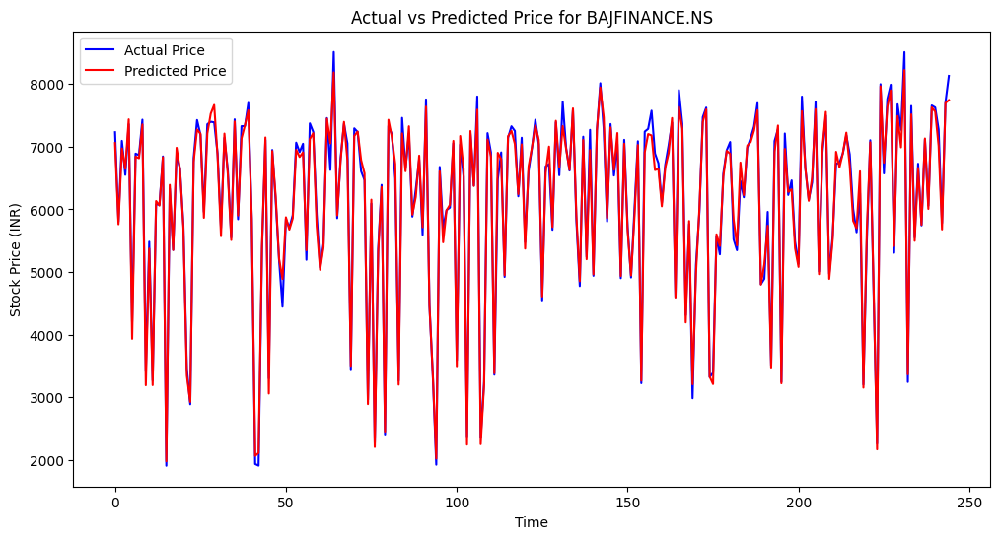


Processing ASIANPAINT.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1274 - val_loss: 0.0020
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0022 - val_loss: 0.0023
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0023 - val_loss: 0.0015
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0015 - val_loss: 0.0012
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0013 - val_loss: 0.0017
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0014 - val_loss: 9.7790e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0011 - val_loss: 0.0011
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step
ASIANPAINT.NS - MAE: 34.008578436691685, MSE: 1990.4539220066254, RMSE: 44.61450349389339, R2 Score: 0.9910

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


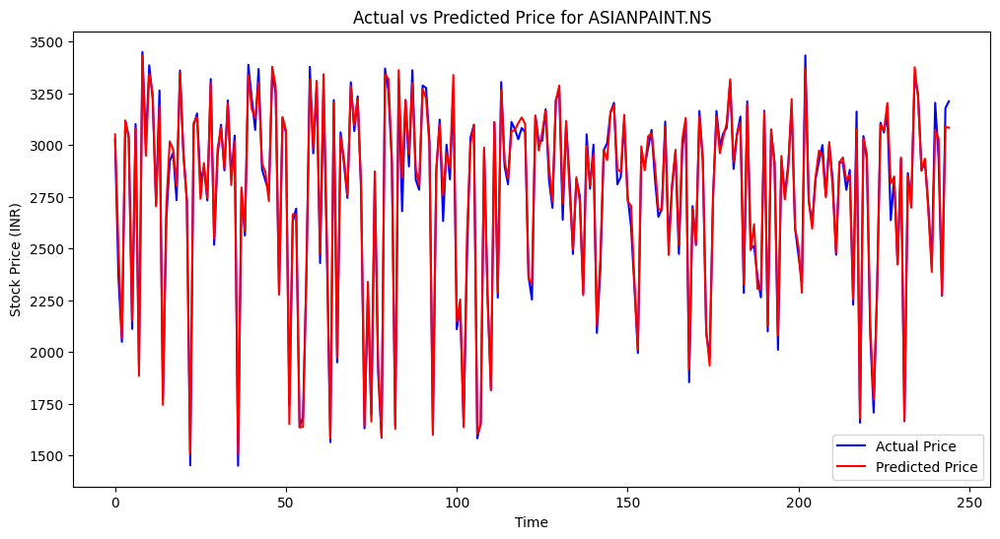


Processing MARUTI.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0681 - val_loss: 0.0014
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 9.5397e-04 - val_loss: 0.0011
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0010 - val_loss: 9.8862e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 9.2166e-04 - val_loss: 6.5568e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 7.4986e-04 - val_loss: 0.0011
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 7.5000e-04 - val_loss: 6.8210e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 9.4961e-04 - val_loss: 0.0018
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0012 - val_loss: 9.2594e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 7.2674e-04 - val_loss: 6.9530e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 6.4109e-04 - val_loss: 5.4688e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step
MARUTI.NS - MAE: 108.15660318258377, MSE: 23186.58485354866

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


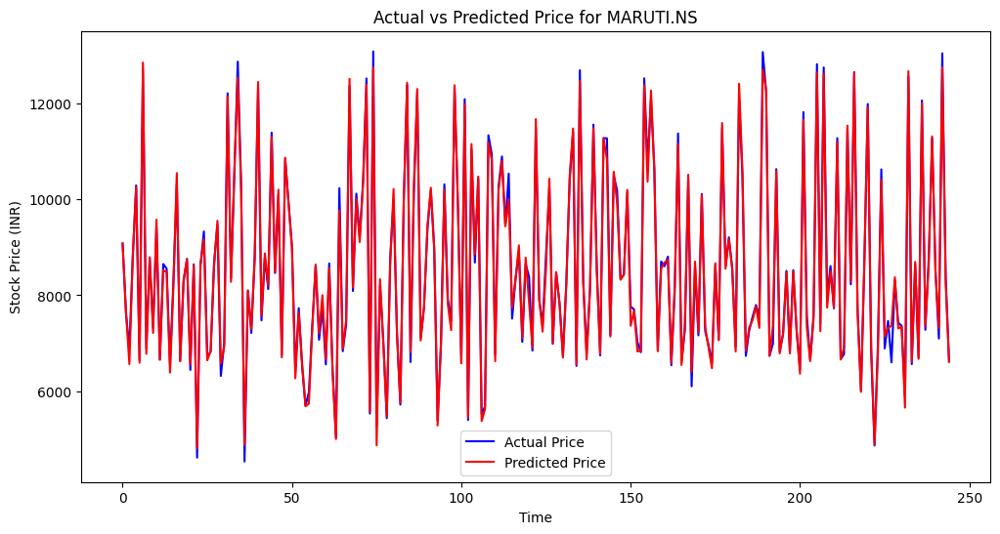


Processing HCLTECH.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.0336 - val_loss: 5.0419e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 8.1406e-04 - val_loss: 3.1881e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 3.9868e-04 - val_loss: 3.4332e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 4.6206e-04 - val_loss: 0.0010
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 6.0970e-04 - val_loss: 2.6223e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 3.4677e-04 - val_loss: 2.4493e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 3.3142e-04 - val_loss: 5.2207e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 4.1125e-04 - val_loss: 4.2268e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 4.3264e-04 - val_loss: 2.8530e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 3.8371e-04 - val_loss: 5.4221e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step
HCLTECH.NS - MAE: 15.311555708628557, M

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


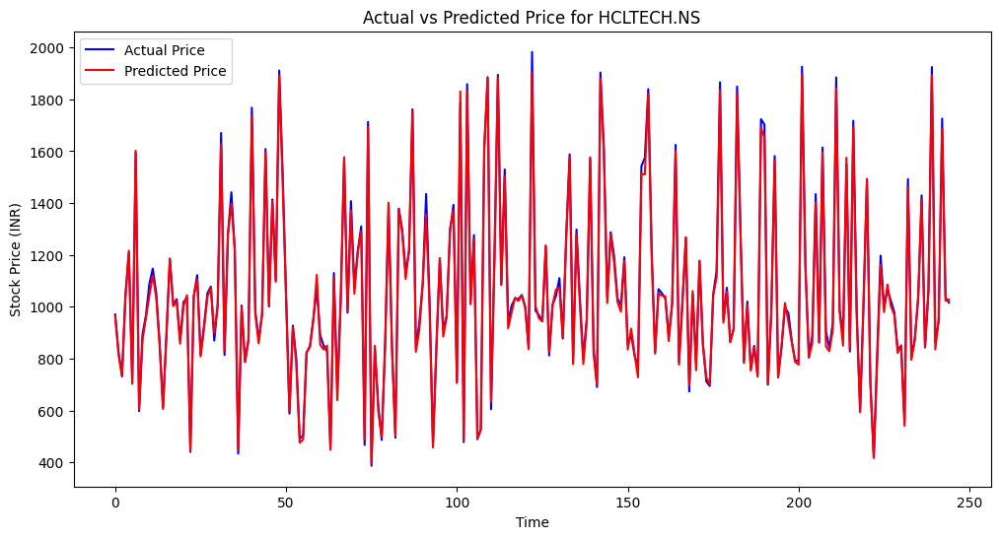


Processing WIPRO.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.0448 - val_loss: 0.0010
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 9.6590e-04 - val_loss: 6.0322e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 9.4370e-04 - val_loss: 7.3948e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.8045e-04 - val_loss: 0.0013
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0010 - val_loss: 5.1383e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 7.8719e-04 - val_loss: 6.1371e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 6.3199e-04 - val_loss: 5.4750e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 8.2098e-04 - val_loss: 4.8726e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 6.1908e-04 - val_loss: 6.3784e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 6.2789e-04 - val_loss: 0.0019
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
WIPRO.NS - MAE: 4.035011673452584, MSE: 24.15193499

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


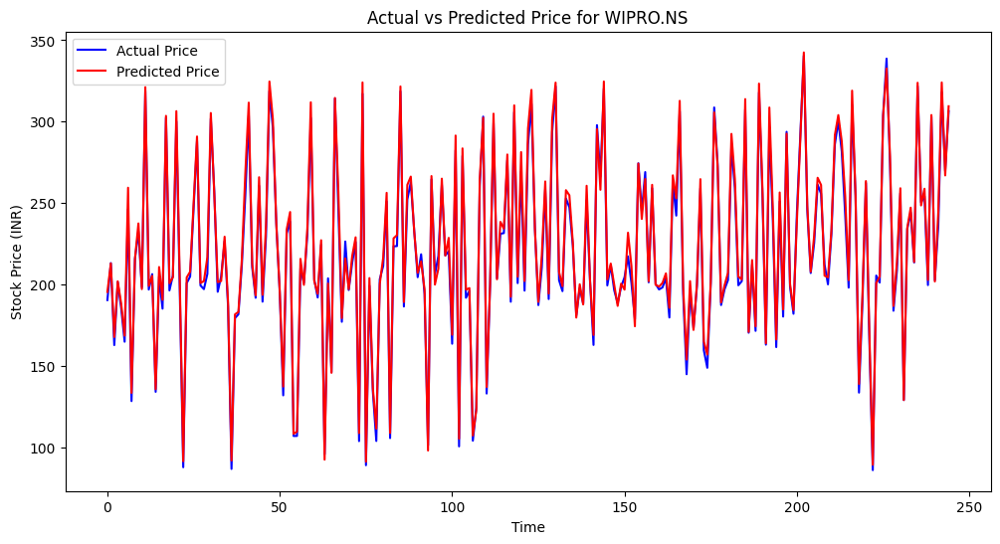


Processing M&M.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0393 - val_loss: 0.0017
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 9.8493e-04 - val_loss: 5.7497e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.7986e-04 - val_loss: 3.0986e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 6.3945e-04 - val_loss: 3.4430e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 3.8956e-04 - val_loss: 3.8042e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 5.3028e-04 - val_loss: 4.9473e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 4.9365e-04 - val_loss: 2.1691e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 4.9306e-04 - val_loss: 2.4557e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 4.4930e-04 - val_loss: 4.4029e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 3.4902e-04 - val_loss: 2.1491e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
M&M.NS - MAE: 20.759445849939432, MSE: 

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


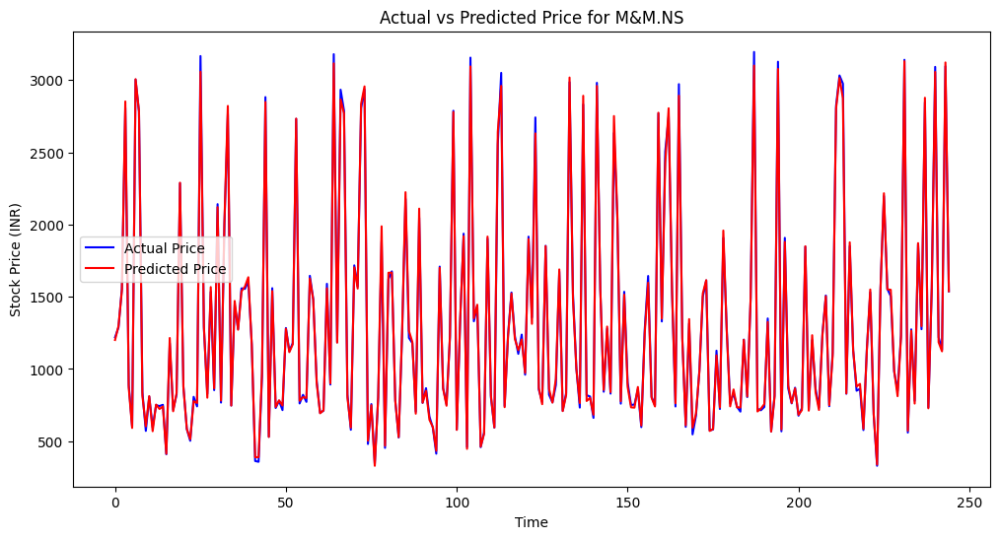


Processing ULTRACEMCO.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.0885 - val_loss: 0.0021
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0010 - val_loss: 6.8096e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 6.9222e-04 - val_loss: 7.2030e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 6.1513e-04 - val_loss: 4.7030e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 5.2986e-04 - val_loss: 7.3873e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 5.8003e-04 - val_loss: 5.5807e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 6.0557e-04 - val_loss: 4.4214e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 5.8864e-04 - val_loss: 4.7565e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 6.4945e-04 - val_loss: 3.7182e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.2392e-04 - val_loss: 4.1445e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
ULTRACEMCO.NS - MAE: 94.83138105853752, MSE

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


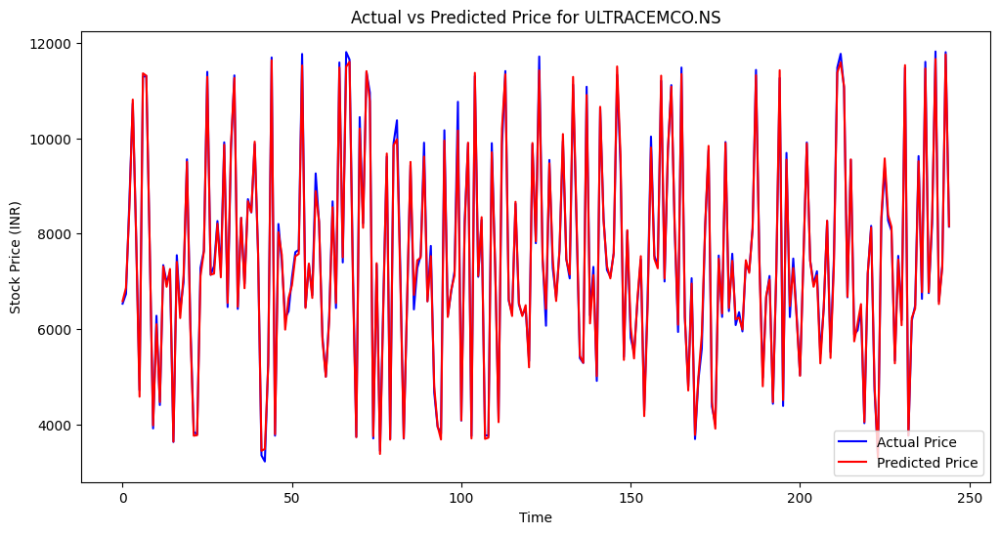


Processing NESTLEIND.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - loss: 0.0678 - val_loss: 0.0012
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0018 - val_loss: 8.6709e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0011 - val_loss: 7.6438e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 9.4247e-04 - val_loss: 7.0518e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.4665e-04 - val_loss: 7.5593e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 7.8846e-04 - val_loss: 6.1556e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.7512e-04 - val_loss: 5.5760e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 8.3369e-04 - val_loss: 7.6681e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 7.3490e-04 - val_loss: 7.9654e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 9.1560e-04 - val_loss: 9.0402e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step
NESTLEIND.NS - MAE: 21.26380139154636, MSE: 744

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


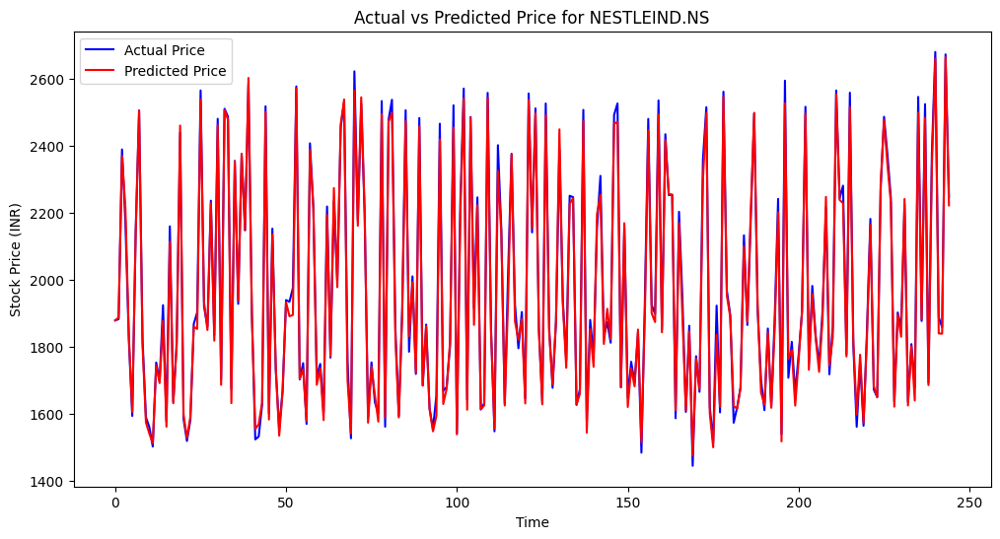


Processing SUNPHARMA.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0351 - val_loss: 2.5832e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 2.9448e-04 - val_loss: 2.0898e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 2.5792e-04 - val_loss: 2.2789e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 3.4120e-04 - val_loss: 1.6000e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 1.8714e-04 - val_loss: 2.6171e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 1.9319e-04 - val_loss: 2.4197e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 2.3969e-04 - val_loss: 1.4226e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 1.9583e-04 - val_loss: 2.1051e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 2.0437e-04 - val_loss: 1.1937e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 1.8165e-04 - val_loss: 2.6322e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step
SUNPHARMA.NS - MAE: 12.484159794476

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


Predicted Closing Price for SUNPHARMA.NS on Next Trading Day: ₹1724.84


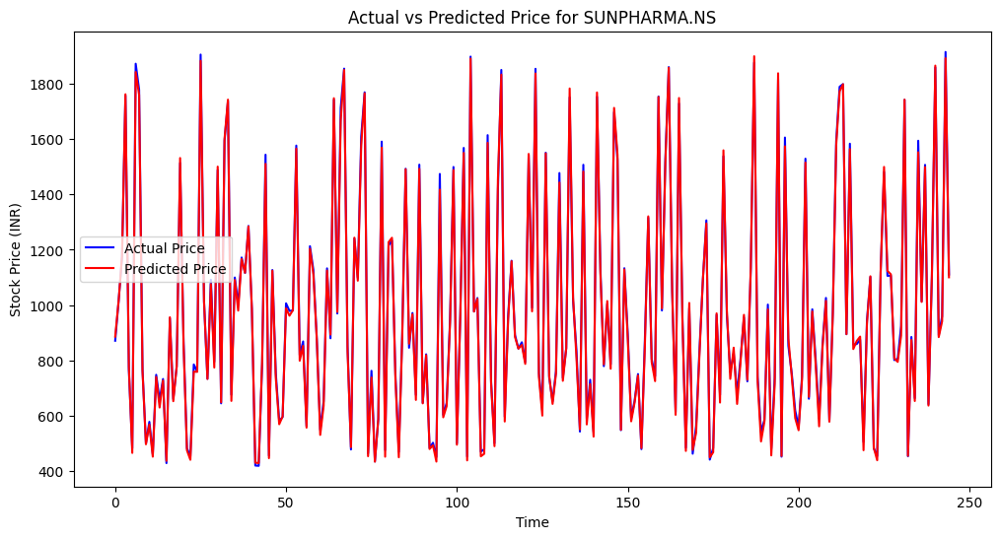


Processing TITAN.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.0923 - val_loss: 0.0016
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 8.2177e-04 - val_loss: 7.5273e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 7.5557e-04 - val_loss: 0.0012
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 9.0911e-04 - val_loss: 4.9600e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 6.2893e-04 - val_loss: 4.7748e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.5625e-04 - val_loss: 0.0012
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 7.9417e-04 - val_loss: 4.7904e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 6.9970e-04 - val_loss: 0.0012
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 9.9444e-04 - val_loss: 5.3859e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
TITAN.NS - MAE: 30.986693726710424, MSE: 1682.6541494128219

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


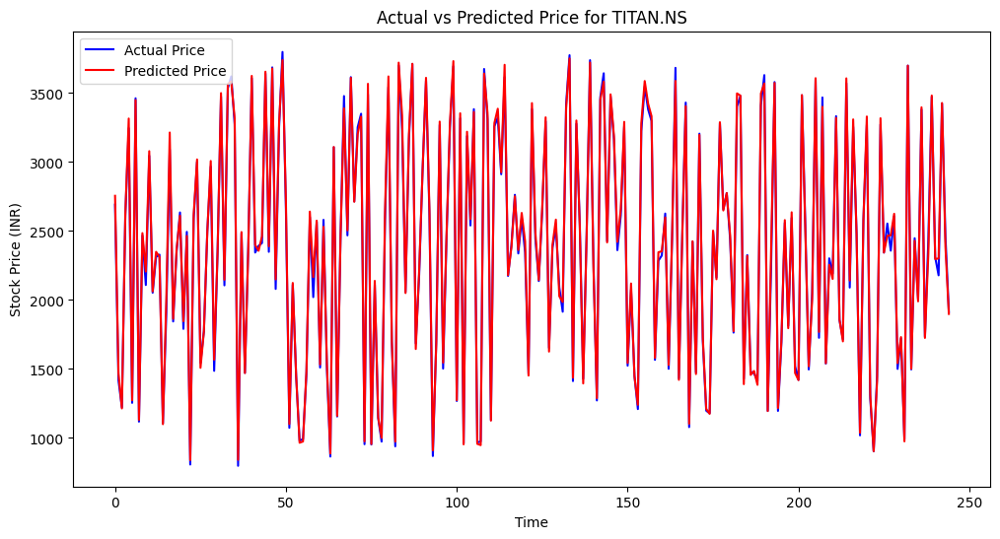


Processing BAJAJFINSV.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.0570 - val_loss: 0.0016
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0012 - val_loss: 9.0097e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0010 - val_loss: 9.6531e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 9.6231e-04 - val_loss: 8.3808e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 8.0075e-04 - val_loss: 0.0014
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 9.7487e-04 - val_loss: 7.5493e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.3965e-04 - val_loss: 7.2588e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 8.2462e-04 - val_loss: 8.8642e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 8.0336e-04 - val_loss: 0.0011
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step
BAJAJFINSV.NS - MAE: 24.235510602887704, MSE: 1015.468620024164

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


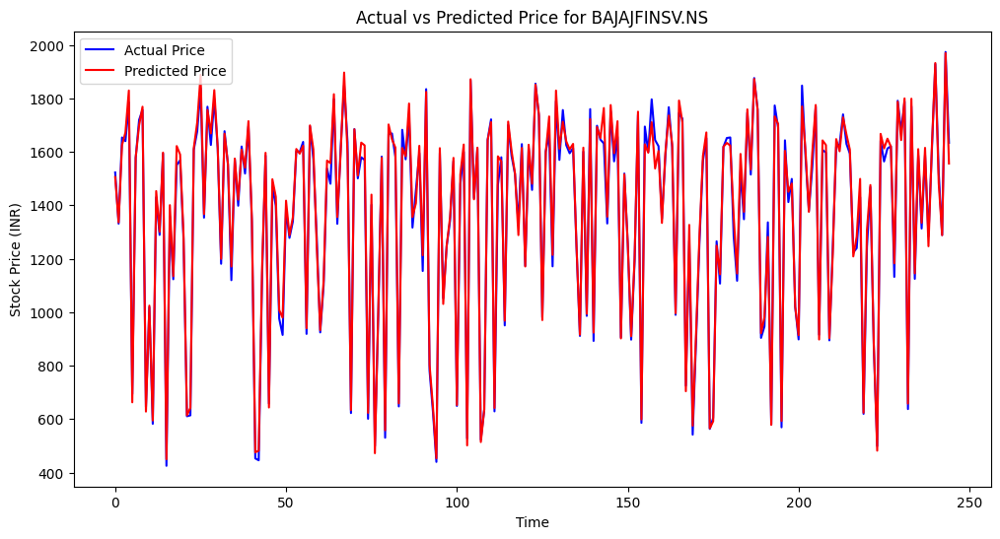


Processing TATASTEEL.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0556 - val_loss: 0.0017
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 8.3693e-04 - val_loss: 6.8909e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 7.2786e-04 - val_loss: 4.8331e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 3.8525e-04 - val_loss: 6.7386e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 6.3861e-04 - val_loss: 5.3983e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 5.2024e-04 - val_loss: 4.8346e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 3.4374e-04 - val_loss: 4.7413e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 3.3565e-04 - val_loss: 6.4288e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 5.1063e-04 - val_loss: 8.2097e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.1260e-04 - val_loss: 7.3786e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step
TATASTEEL.NS - MAE: 1.812559454002129, 

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


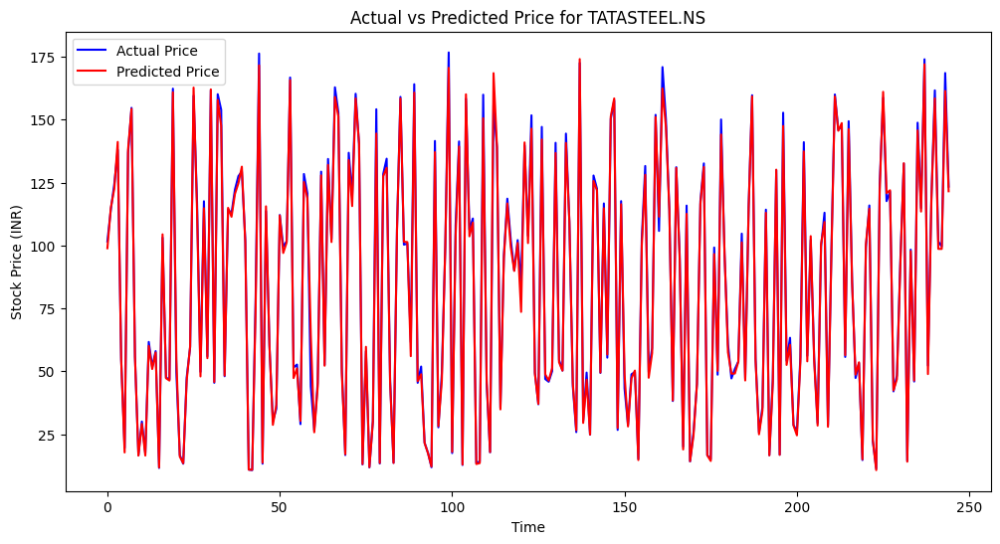


Processing POWERGRID.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0311 - val_loss: 9.7847e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.5155e-04 - val_loss: 4.7762e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 6.2994e-04 - val_loss: 3.7096e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 3.2278e-04 - val_loss: 8.8971e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 5.5850e-04 - val_loss: 2.3383e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 4.9915e-04 - val_loss: 2.7647e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 3.9081e-04 - val_loss: 2.5559e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 3.2140e-04 - val_loss: 4.8272e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 3.9710e-04 - val_loss: 1.9543e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 2.9110e-04 - val_loss: 2.8766e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step
POWERGRID.NS - MAE: 2.4474098879503

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


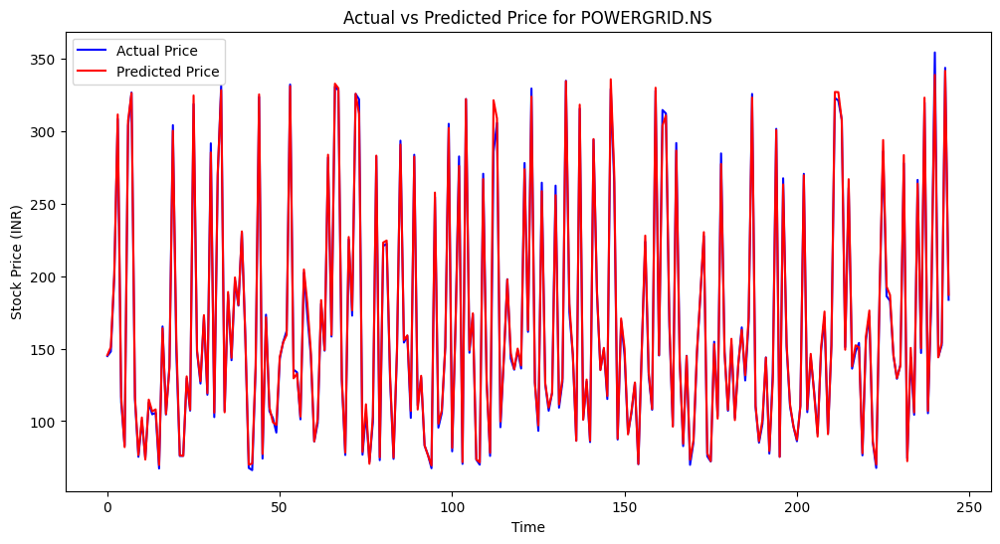


Processing NTPC.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.0581 - val_loss: 4.9529e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 6.1346e-04 - val_loss: 4.0247e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.7778e-04 - val_loss: 2.7167e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 3.9893e-04 - val_loss: 5.0696e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 3.9042e-04 - val_loss: 4.4143e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.5111e-04 - val_loss: 4.2101e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 4.6228e-04 - val_loss: 2.4220e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 3.5696e-04 - val_loss: 2.5705e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 3.2437e-04 - val_loss: 2.6238e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 3.1859e-04 - val_loss: 3.7195e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
NTPC.NS - MAE: 2.9728291215073606, 

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


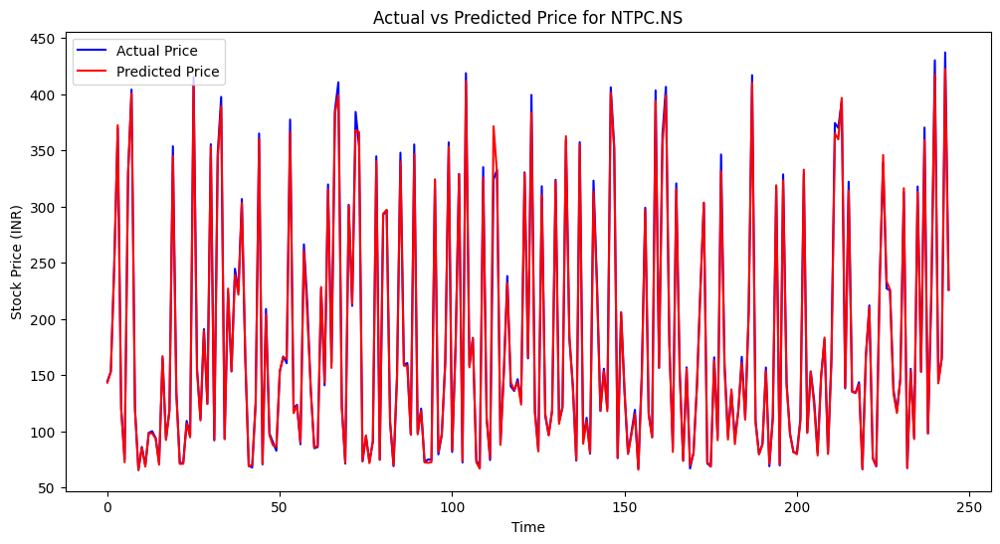


Processing DIVISLAB.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0667 - val_loss: 0.0011
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0011 - val_loss: 8.8962e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 8.9335e-04 - val_loss: 7.3997e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 9.0128e-04 - val_loss: 7.5807e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 6.7717e-04 - val_loss: 0.0011
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.9042e-04 - val_loss: 9.3101e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 7.3512e-04 - val_loss: 0.0016
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.4542e-04 - val_loss: 6.3498e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 6.4043e-04 - val_loss: 9.2835e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 6.8982e-04 - val_loss: 0.0011
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step
DIVISLAB.NS - MAE: 62.51446338630591, MSE: 7068.5225896

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


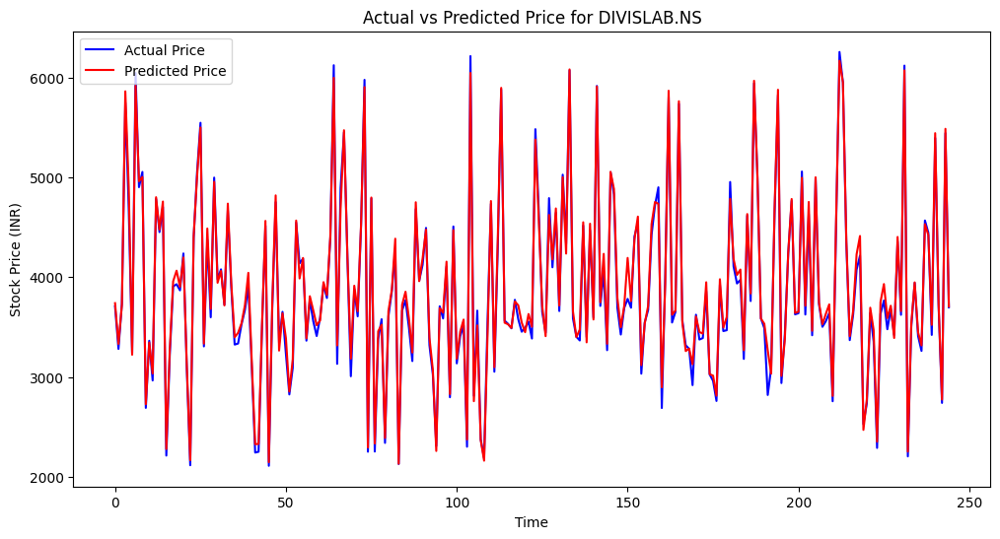


Processing JSWSTEEL.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - loss: 0.1314 - val_loss: 0.0021
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0018 - val_loss: 7.2186e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 8.0340e-04 - val_loss: 0.0011
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 6.8951e-04 - val_loss: 8.0682e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 8.0174e-04 - val_loss: 5.3040e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.6967e-04 - val_loss: 6.0106e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 6.7937e-04 - val_loss: 5.4419e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 6.7087e-04 - val_loss: 4.8506e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 5.0098e-04 - val_loss: 4.9405e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.7581e-04 - val_loss: 0.0011
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step
JSWSTEEL.NS - MAE: 12.089529793164058, MSE: 260.931

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


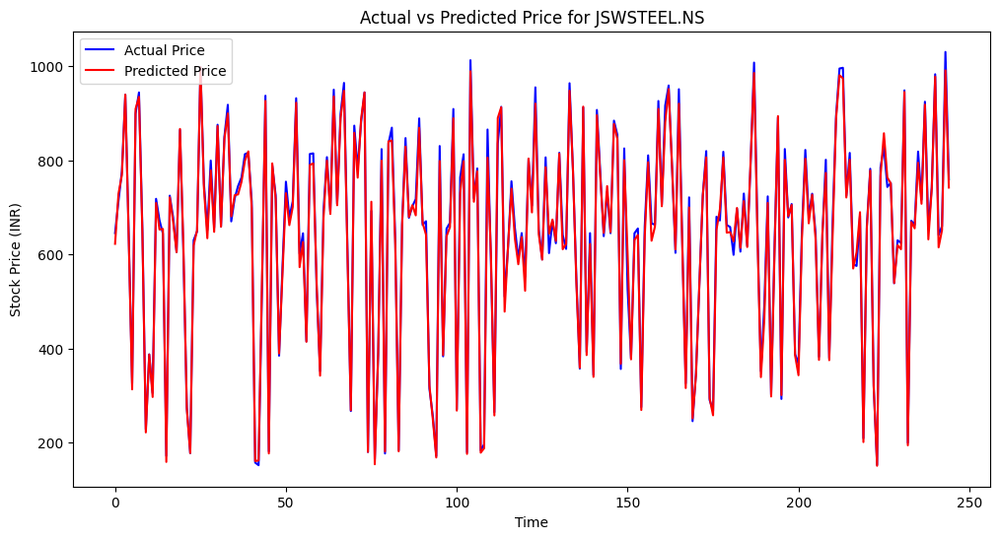


Processing TECHM.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.0756 - val_loss: 0.0011
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 8.9196e-04 - val_loss: 7.1401e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.5797e-04 - val_loss: 6.4875e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 7.5817e-04 - val_loss: 6.4696e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 6.3056e-04 - val_loss: 7.9599e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.7250e-04 - val_loss: 6.4407e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 5.9208e-04 - val_loss: 0.0022
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0010 - val_loss: 8.1822e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 5.7314e-04 - val_loss: 4.8435e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 7.5128e-04 - val_loss: 7.1547e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
TECHM.NS - MAE: 18.67540851227071, MSE: 558.944

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


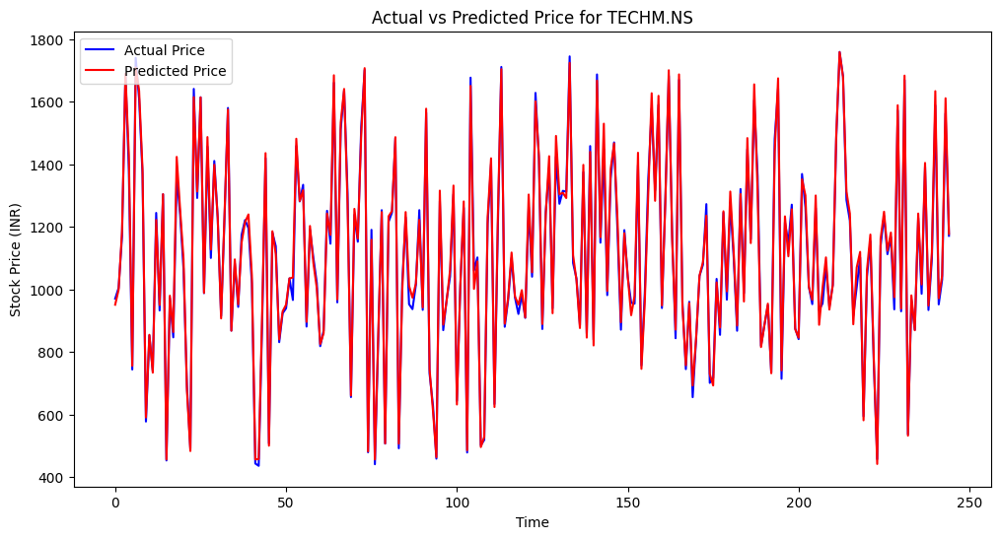


Processing BAJAJ-AUTO.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0326 - val_loss: 0.0013
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 8.0572e-04 - val_loss: 2.8994e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 2.9190e-04 - val_loss: 3.9148e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 2.9884e-04 - val_loss: 4.5990e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 3.5335e-04 - val_loss: 1.6965e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 2.6609e-04 - val_loss: 1.6494e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 2.4802e-04 - val_loss: 4.6190e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 3.2724e-04 - val_loss: 4.2333e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 3.4897e-04 - val_loss: 1.8535e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 2.7745e-04 - val_loss: 8.0860e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step
BAJAJ-AUTO.NS - MAE: 105.78986793118541

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


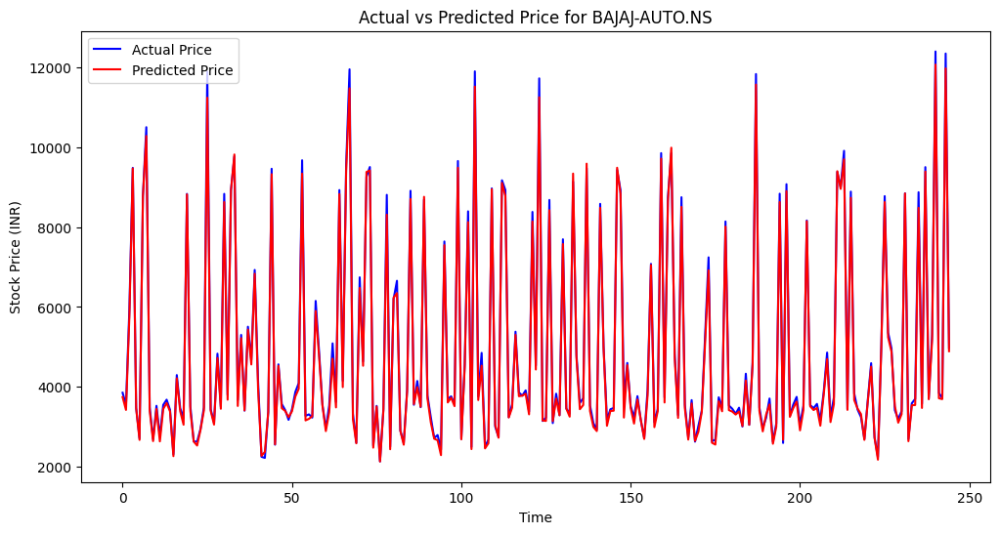


Processing ADANIPORTS.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0540 - val_loss: 0.0012
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0011 - val_loss: 8.7029e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 8.3796e-04 - val_loss: 9.7560e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 8.0511e-04 - val_loss: 8.0639e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 5.9699e-04 - val_loss: 0.0012
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0010 - val_loss: 5.9749e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 6.5143e-04 - val_loss: 7.8399e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.4582e-04 - val_loss: 5.6773e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.2159e-04 - val_loss: 7.7071e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 6.5953e-04 - val_loss: 6.5427e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step
ADANIPORTS.NS - MAE: 16.049551312437405, MSE: 821.6

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


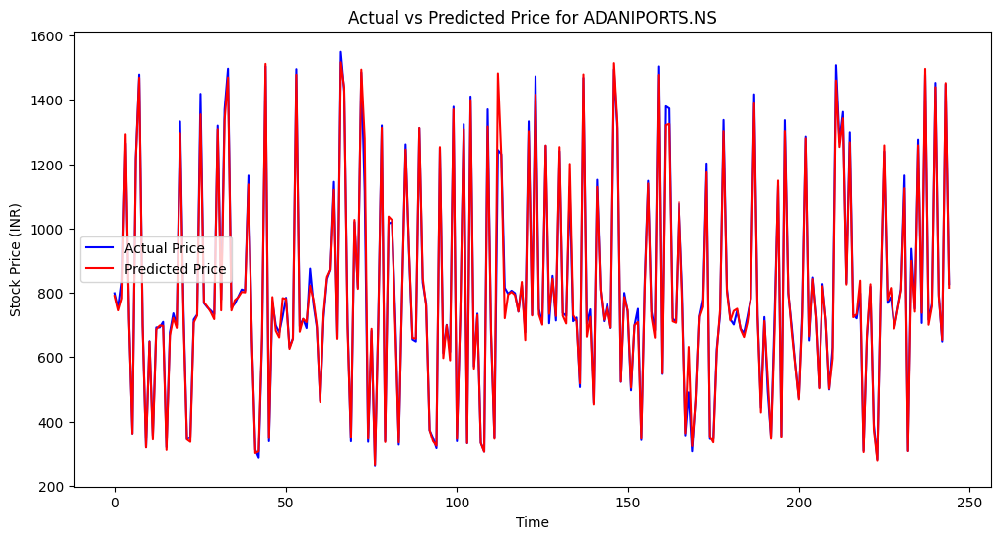


Processing GRASIM.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.0809 - val_loss: 9.3600e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.9085e-04 - val_loss: 5.1069e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 5.9088e-04 - val_loss: 0.0010
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 9.1852e-04 - val_loss: 4.0426e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 4.4834e-04 - val_loss: 5.0436e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 4.4421e-04 - val_loss: 4.5845e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.6184e-04 - val_loss: 8.6741e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 5.9989e-04 - val_loss: 5.2799e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.9404e-04 - val_loss: 0.0012
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 5.5736e-04 - val_loss: 4.9086e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
GRASIM.NS - MAE: 23.995328822364037, MSE: 1

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


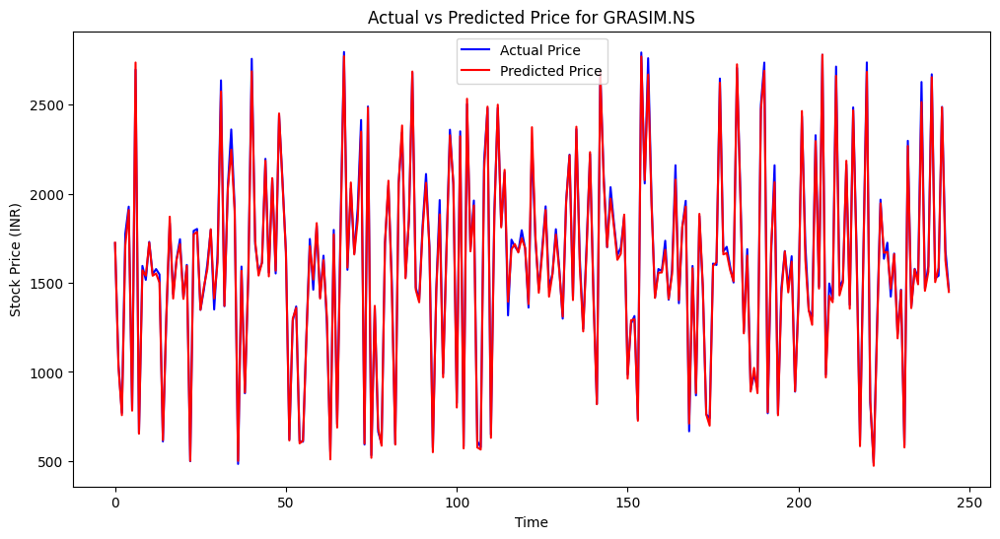


Processing HINDALCO.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.0558 - val_loss: 0.0013
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 8.7644e-04 - val_loss: 7.8778e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.0282e-04 - val_loss: 7.9526e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 5.7990e-04 - val_loss: 9.5663e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.7080e-04 - val_loss: 6.1632e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.0448e-04 - val_loss: 7.9266e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 6.8960e-04 - val_loss: 5.3121e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 5.7963e-04 - val_loss: 6.3188e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 9.4402e-04 - val_loss: 9.3442e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.0503e-04 - val_loss: 4.5577e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step
HINDALCO.NS - MAE: 8.015653317470392, M

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


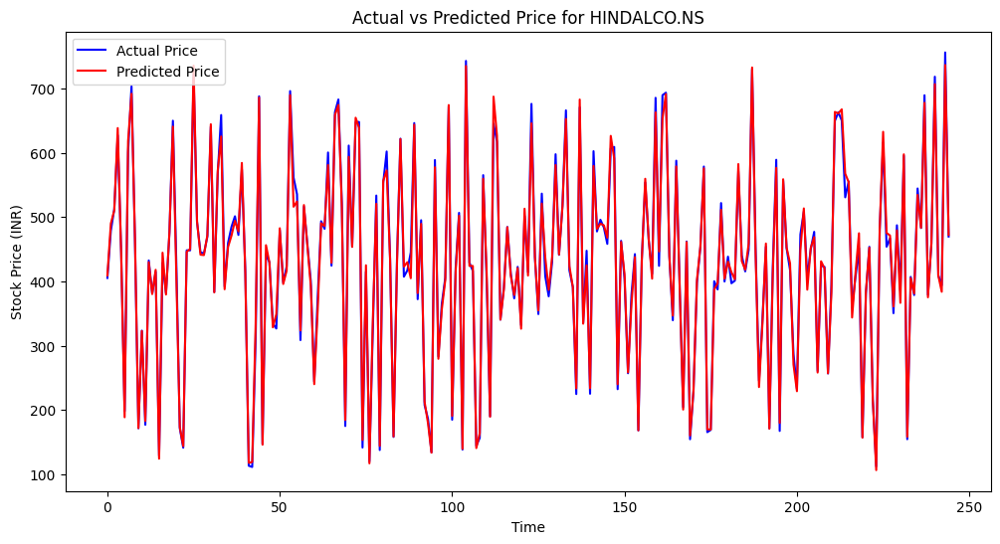


Processing TATAMOTORS.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0530 - val_loss: 0.0014
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0012 - val_loss: 4.7098e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.7611e-04 - val_loss: 6.7309e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.9048e-04 - val_loss: 3.4123e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 4.6255e-04 - val_loss: 3.1393e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 4.8718e-04 - val_loss: 0.0010
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 6.8430e-04 - val_loss: 2.8824e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 4.5172e-04 - val_loss: 3.6870e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.1459e-04 - val_loss: 0.0011
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.8194e-04 - val_loss: 2.7354e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step
TATAMOTORS.NS - MAE: 9.053417351915094, MSE: 161.13

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


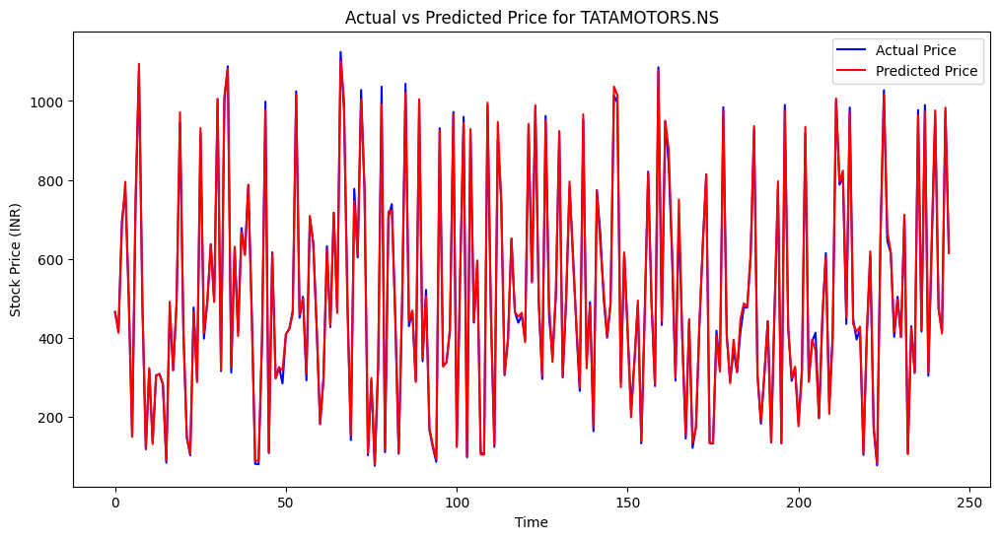


Processing ONGC.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0140 - val_loss: 5.5106e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.6757e-04 - val_loss: 0.0010
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.0371e-04 - val_loss: 3.6930e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 6.4682e-04 - val_loss: 6.5992e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 6.2714e-04 - val_loss: 3.3281e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.7995e-04 - val_loss: 3.4559e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.1375e-04 - val_loss: 4.0096e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 5.1647e-04 - val_loss: 0.0011
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.0374e-04 - val_loss: 6.0849e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 6.7157e-04 - val_loss: 5.8658e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step
ONGC.NS - MAE: 2.9893933212708066, MSE: 21.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


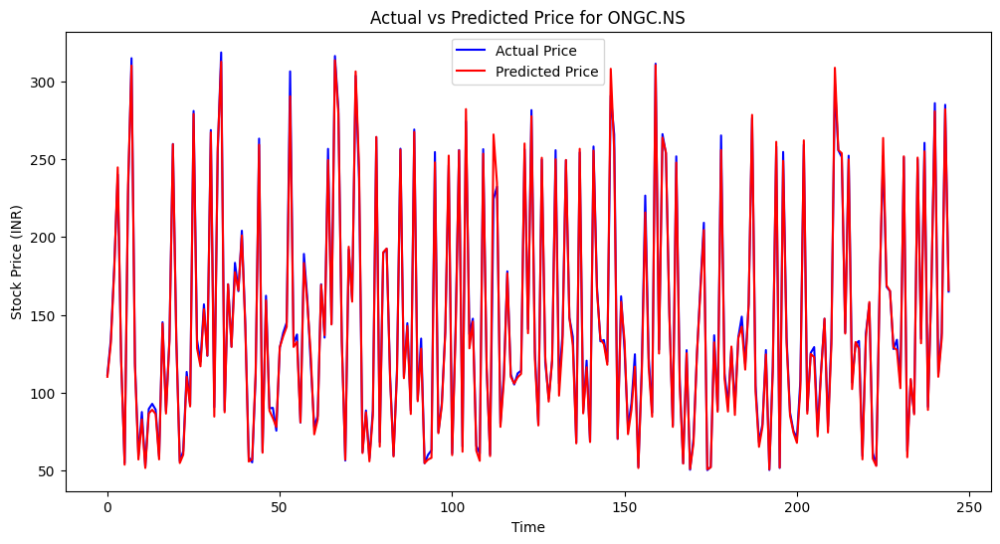


Processing BRITANNIA.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0629 - val_loss: 8.8061e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 9.2383e-04 - val_loss: 5.0384e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 7.2050e-04 - val_loss: 8.4333e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 7.1193e-04 - val_loss: 4.5677e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 5.6504e-04 - val_loss: 0.0022
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 8.3186e-04 - val_loss: 3.5302e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.5721e-04 - val_loss: 9.2324e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 9.0060e-04 - val_loss: 3.6001e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 4.8505e-04 - val_loss: 7.4462e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.1004e-04 - val_loss: 0.0020
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step
BRITANNIA.NS - MAE: 68.65052379757455, MSE:

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


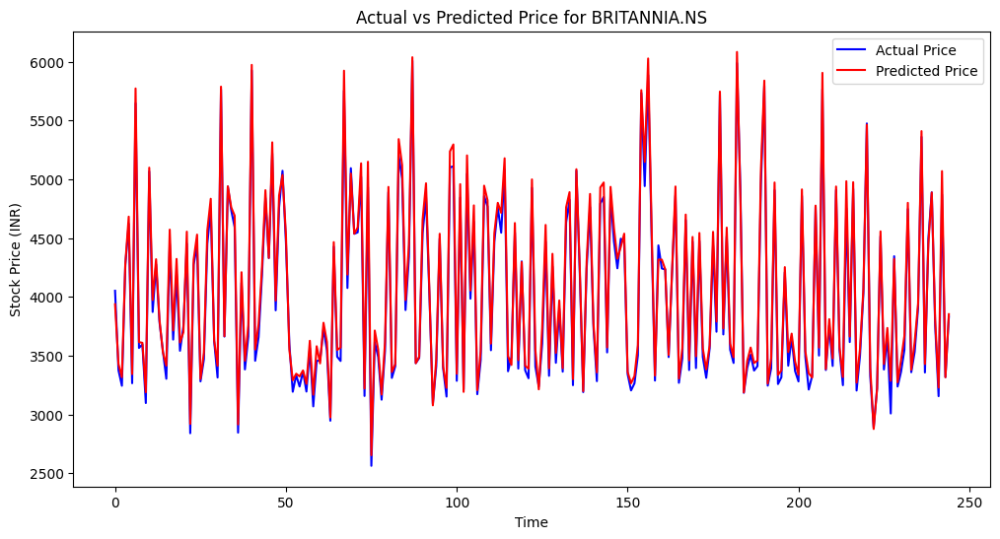


Processing CIPLA.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - loss: 0.0464 - val_loss: 6.8119e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 7.0556e-04 - val_loss: 5.0110e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 6.6453e-04 - val_loss: 4.3188e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 6.8069e-04 - val_loss: 5.1349e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 5.8660e-04 - val_loss: 3.4607e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 3.7590e-04 - val_loss: 0.0010
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.7099e-04 - val_loss: 5.5894e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 4.3045e-04 - val_loss: 3.4458e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 4.6689e-04 - val_loss: 8.1676e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0010 - val_loss: 3.1320e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step
CIPLA.NS - MAE: 12.61665482658996, MSE: 285

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


Predicted Closing Price for CIPLA.NS on Next Trading Day: ₹1466.00


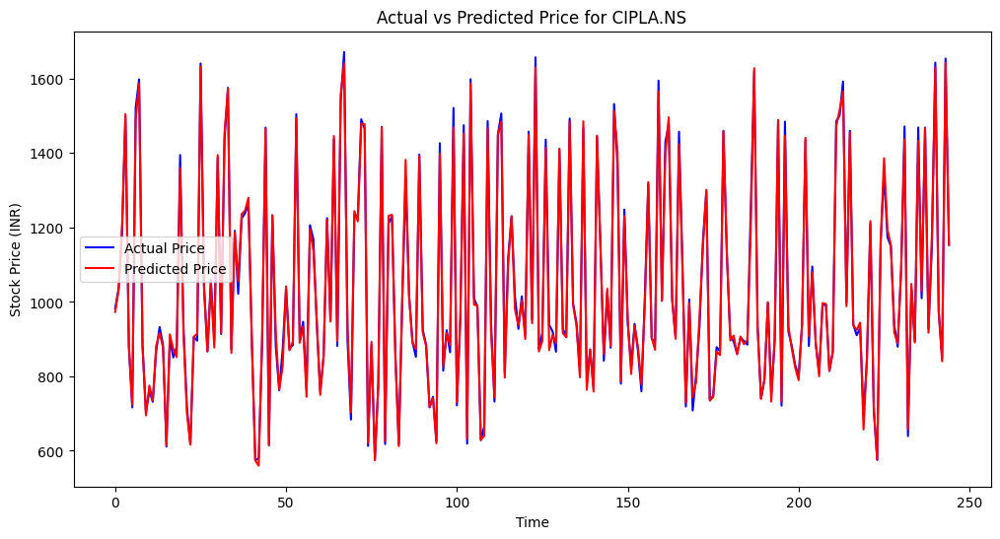


Processing SHREECEM.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0547 - val_loss: 0.0035
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0035 - val_loss: 0.0020
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0019 - val_loss: 0.0030
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0023 - val_loss: 0.0015
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0015 - val_loss: 0.0014
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
SHREECEM.NS - MAE: 345.7401812929289, MSE: 211009.26272083702, RMSE: 459.35744548318473, R2 Score: 0.9732576307

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


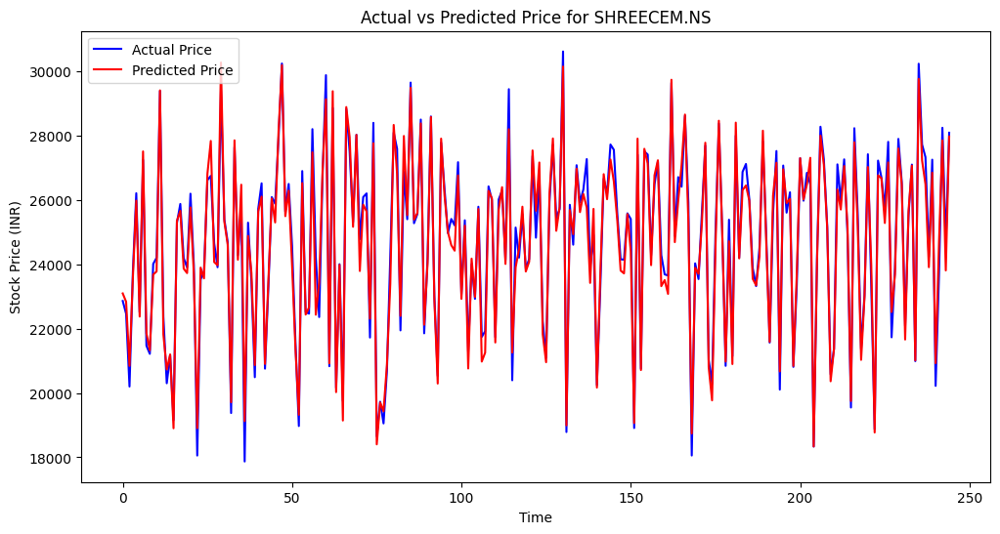


Processing EICHERMOT.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0641 - val_loss: 0.0025
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0012 - val_loss: 9.8494e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 8.2823e-04 - val_loss: 0.0029
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0011 - val_loss: 5.0828e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.9213e-04 - val_loss: 4.6990e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 7.9233e-04 - val_loss: 0.0017
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.5464e-04 - val_loss: 7.0119e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 7.9188e-04 - val_loss: 9.5604e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 5.4815e-04 - val_loss: 5.9265e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 5.5377e-04 - val_loss: 4.1856e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step
EICHERMOT.NS - MAE: 48.06546390269984, MSE: 4171.117349

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


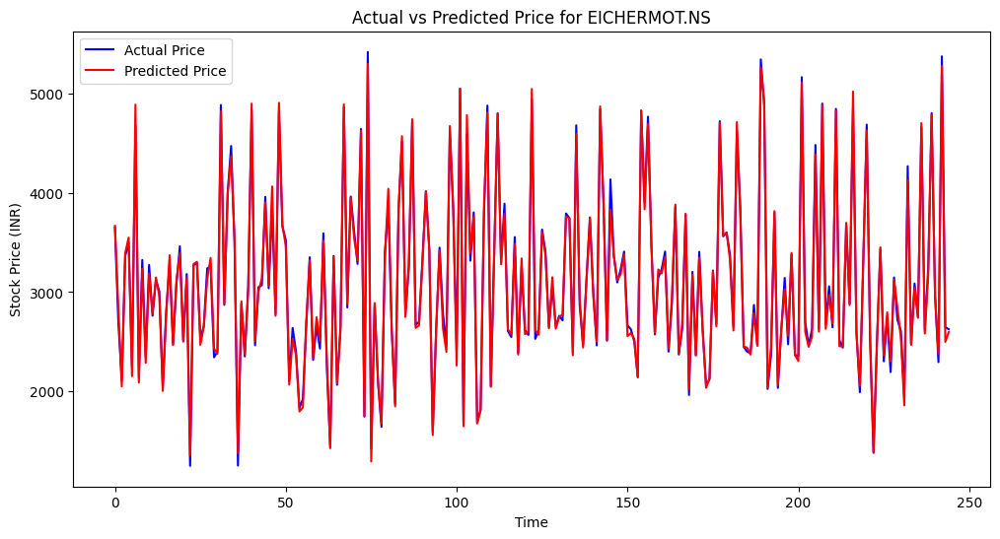


Processing HEROMOTOCO.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0312 - val_loss: 0.0014
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 9.5837e-04 - val_loss: 4.3212e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.9234e-04 - val_loss: 4.0033e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 5.9967e-04 - val_loss: 3.6139e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.1350e-04 - val_loss: 3.0743e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 4.2186e-04 - val_loss: 3.1043e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 3.8969e-04 - val_loss: 0.0013
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 8.9015e-04 - val_loss: 7.6518e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.5358e-04 - val_loss: 2.6926e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.4067e-04 - val_loss: 2.8140e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step
HEROMOTOCO.NS - MAE: 41.280183846535714, MS

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


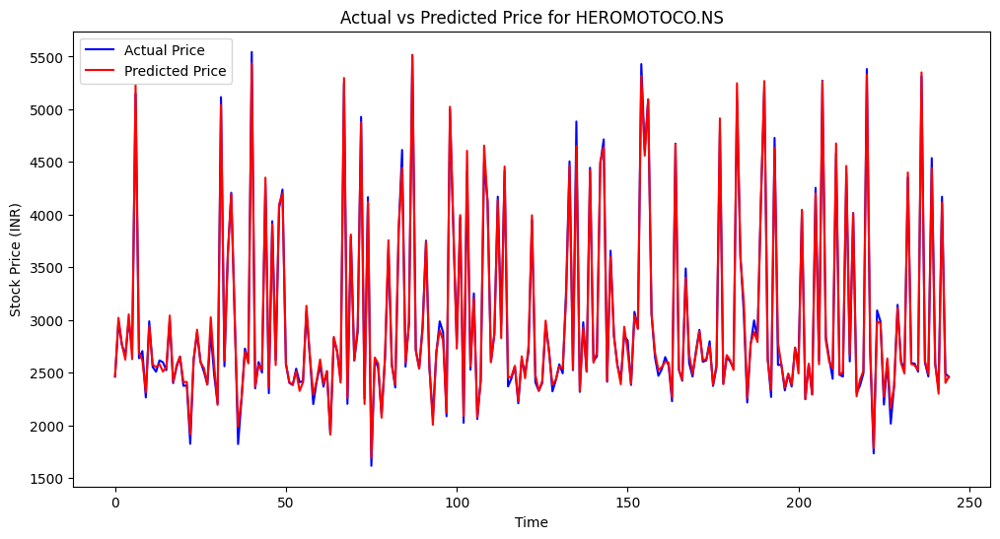


Processing DRREDDY.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0845 - val_loss: 0.0010
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0011 - val_loss: 7.0695e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 9.9026e-04 - val_loss: 5.9983e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 7.8418e-04 - val_loss: 6.2927e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 8.5650e-04 - val_loss: 6.2949e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 8.2590e-04 - val_loss: 5.1803e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 8.5637e-04 - val_loss: 5.1764e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 7.3622e-04 - val_loss: 6.9425e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.5467e-04 - val_loss: 4.8893e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 6.9745e-04 - val_loss: 4.7870e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
DRREDDY.NS - MAE: 10.242423901124791, MSE: 

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


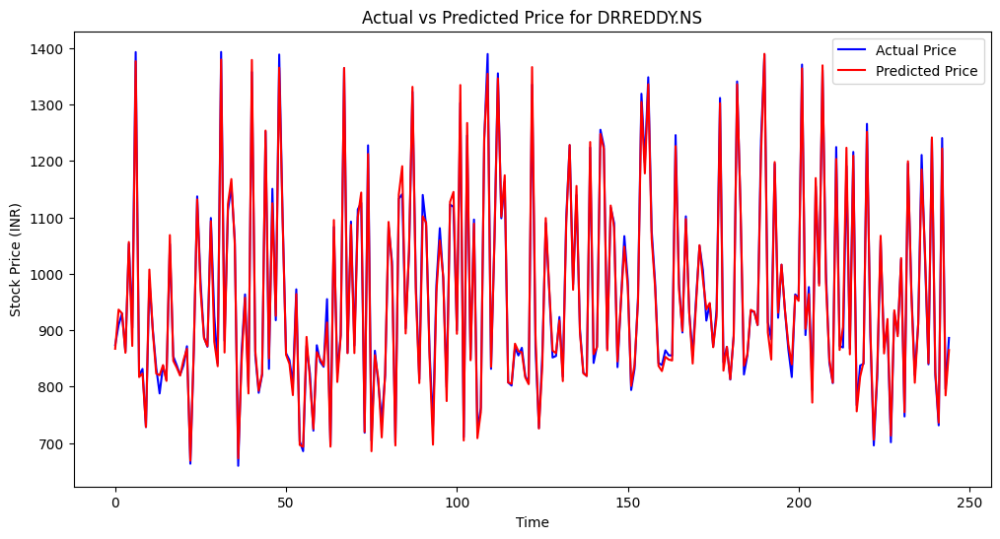


Processing SBILIFE.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - loss: 0.0628 - val_loss: 0.0011
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.0011 - val_loss: 6.8843e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.6531e-04 - val_loss: 9.6023e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 6.7983e-04 - val_loss: 5.1959e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.8778e-04 - val_loss: 5.9428e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.2971e-04 - val_loss: 0.0011
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 5.0581e-04 - val_loss: 5.2199e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 4.6787e-04 - val_loss: 4.2138e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.2133e-04 - val_loss: 4.7248e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.1237e-04 - val_loss: 4.0828e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
SBILIFE.NS - MAE: 16.046821473884947, MSE: 483.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


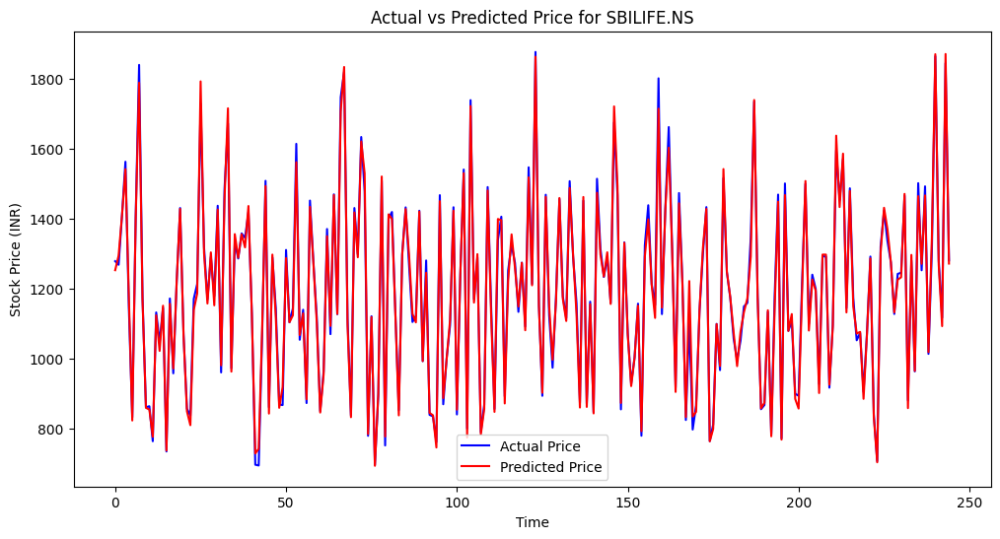


Processing INDUSINDBK.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0967 - val_loss: 0.0018
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0018 - val_loss: 8.6974e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0013 - val_loss: 8.6800e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0012 - val_loss: 8.1364e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0011 - val_loss: 8.5454e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 8.6214e-04 - val_loss: 9.2743e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0012 - val_loss: 8.6591e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 9.1093e-04 - val_loss: 8.3011e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 9.1501e-04 - val_loss: 9.7398e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step
INDUSINDBK.NS - MAE: 20.860356352106546, MSE: 754.5311359737007, RM

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


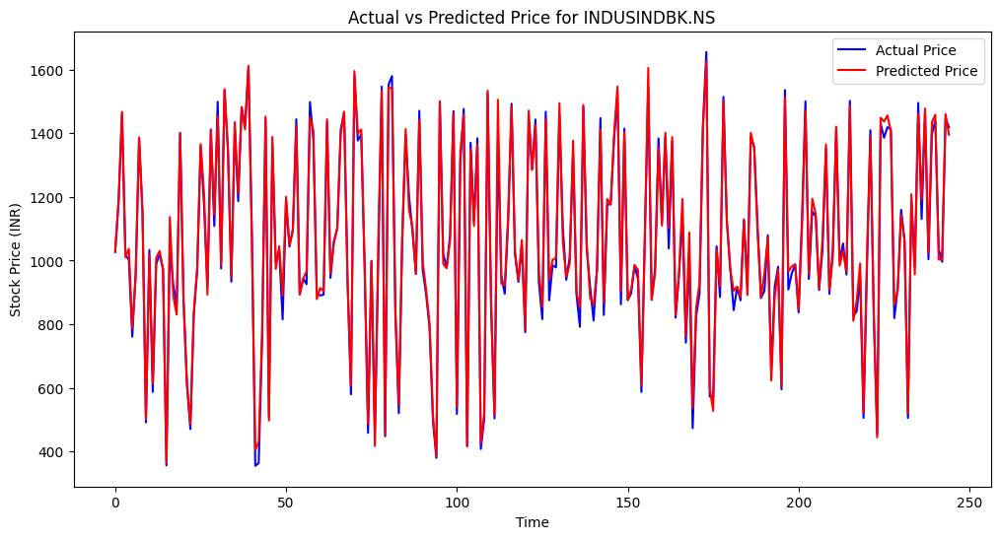


Processing TATACONSUM.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0921 - val_loss: 0.0012
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 8.3466e-04 - val_loss: 4.9808e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.9049e-04 - val_loss: 4.9127e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 4.0093e-04 - val_loss: 4.3069e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.0863e-04 - val_loss: 5.4862e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.9329e-04 - val_loss: 4.3091e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 4.5951e-04 - val_loss: 5.6349e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 5.0416e-04 - val_loss: 5.4683e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.8653e-04 - val_loss: 5.0444e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 4.0548e-04 - val_loss: 3.5910e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step
TATACONSUM.NS - MAE: 10.163481747313556

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


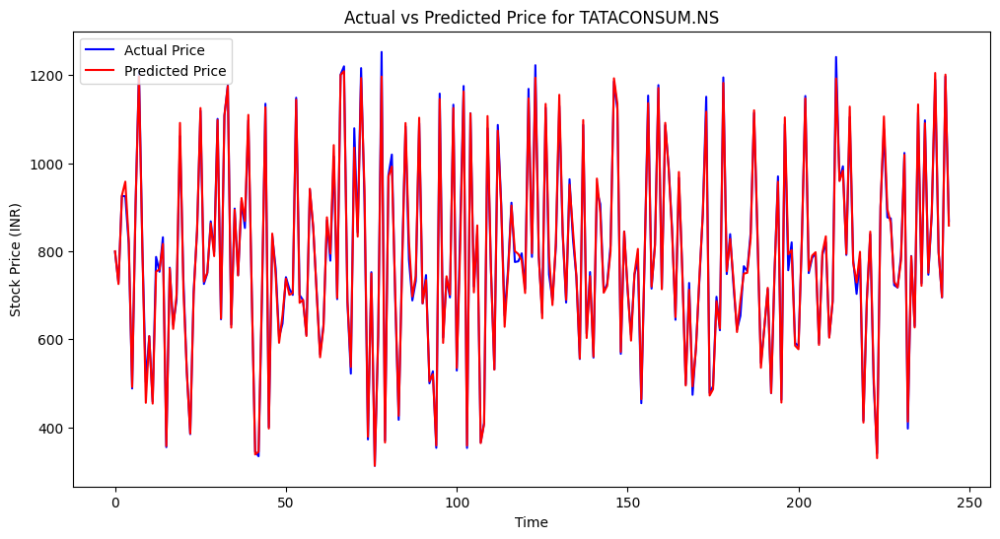


Processing BPCL.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0319 - val_loss: 0.0016
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 9.8372e-04 - val_loss: 9.3126e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 8.3735e-04 - val_loss: 9.0864e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 9.5168e-04 - val_loss: 7.6841e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.6264e-04 - val_loss: 8.5599e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 9.9806e-04 - val_loss: 9.1299e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 8.3398e-04 - val_loss: 7.4124e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 6.8287e-04 - val_loss: 6.5535e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 5.6731e-04 - val_loss: 6.6897e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step
BPCL.NS - MAE: 3.3168193812825133, MSE: 26.0272

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


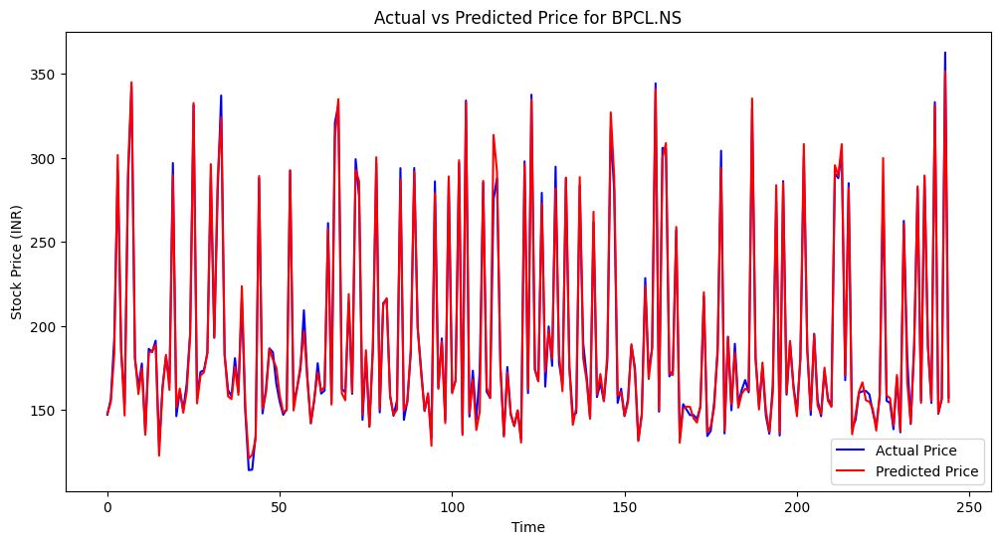


Processing HDFCLIFE.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0801 - val_loss: 0.0027
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0017 - val_loss: 0.0020
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0015 - val_loss: 0.0026
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step
HDFCLIFE.NS - MAE: 9.530155116838488, MSE: 159.9778605872429, RMSE: 12.648235473268313, R2 Score: 0.96354875780

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


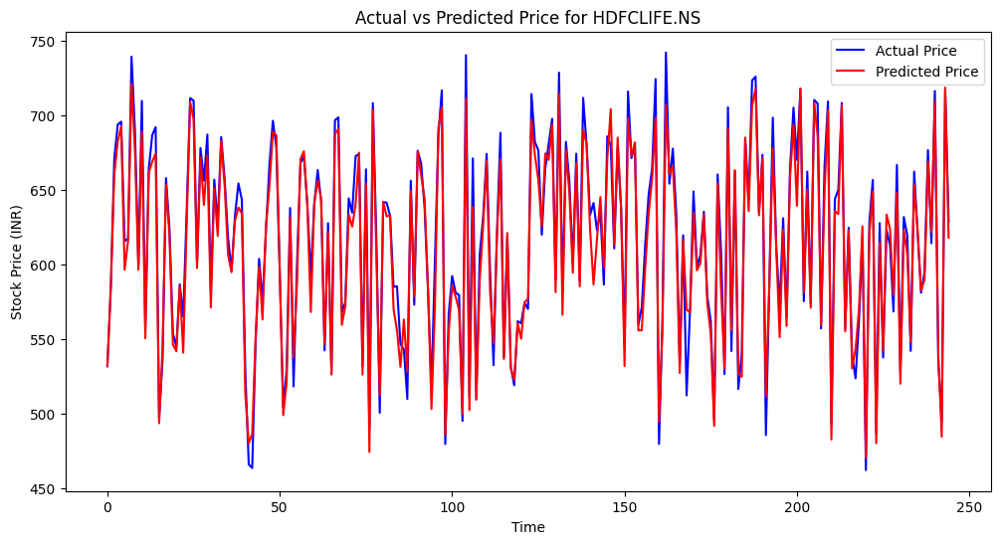


Processing ICICIGI.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0361 - val_loss: 0.0012
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0015 - val_loss: 0.0012
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0010 - val_loss: 7.7421e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 7.8038e-04 - val_loss: 5.1129e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 6.2679e-04 - val_loss: 6.8136e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.3487e-04 - val_loss: 4.9967e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 6.4286e-04 - val_loss: 5.7716e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 8.7435e-04 - val_loss: 5.8542e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 9.3801e-04 - val_loss: 4.6761e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 5.7761e-04 - val_loss: 4.5474e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step
ICICIGI.NS - MAE: 17.53713539697941, MSE: 550.88065

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


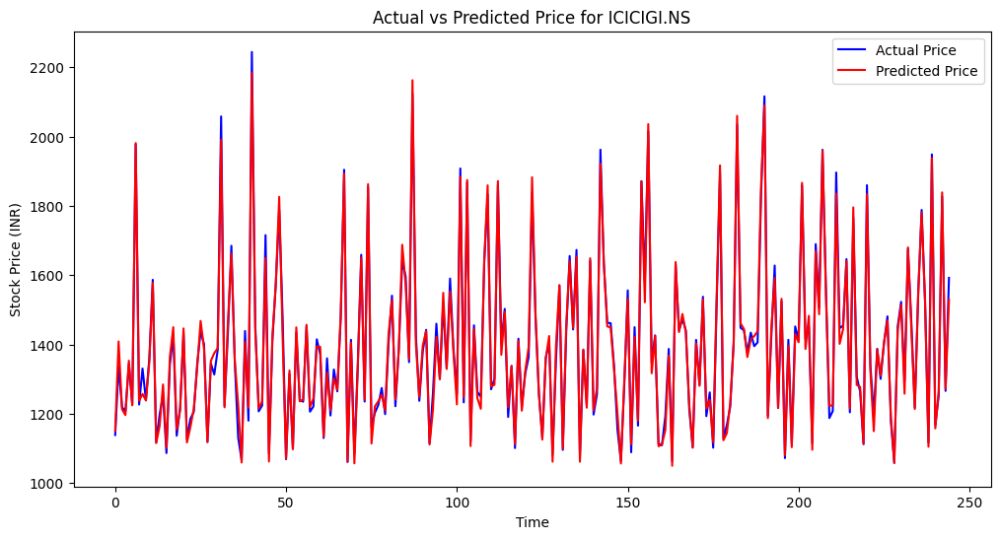


Processing SBICARD.NS...


Device set to use cpu


Epoch 1/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0760 - val_loss: 0.0025
Epoch 2/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0031 - val_loss: 0.0021
Epoch 3/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0020 - val_loss: 0.0032
Epoch 4/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 5/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0015 - val_loss: 0.0014
Epoch 6/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 7/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 8/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 9/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0015 - val_loss: 0.0011
Epoch 10/10
61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0012 - val_loss: 0.0016
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step
SBICARD.NS - MAE: 11.959708399908116, MSE: 252.63236590730784, RMSE: 15.894413040666455, R2 Score: 0.9820272929

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


Predicted Closing Price for SBICARD.NS on Next Trading Day: ₹855.10


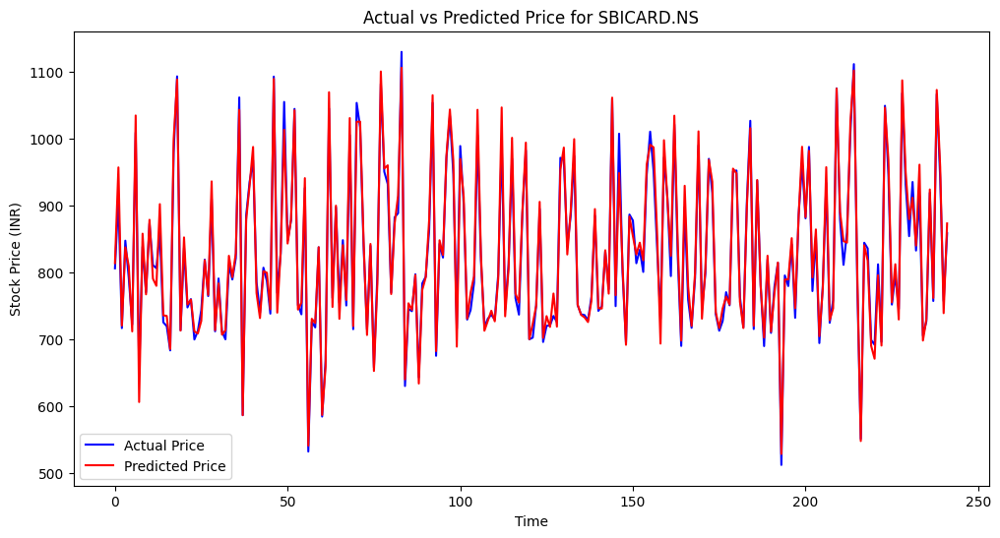


Processing DLF.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0755 - val_loss: 0.0026
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0015 - val_loss: 7.4873e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 7.8896e-04 - val_loss: 6.0501e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 6.0339e-04 - val_loss: 9.6319e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 6.4025e-04 - val_loss: 5.0092e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 5.2265e-04 - val_loss: 6.5655e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.6877e-04 - val_loss: 6.6023e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 4.5623e-04 - val_loss: 6.7133e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 5.5634e-04 - val_loss: 5.8457e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.8125e-04 - val_loss: 4.4424e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
DLF.NS - MAE: 8.353486145867427, MSE: 170.1

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


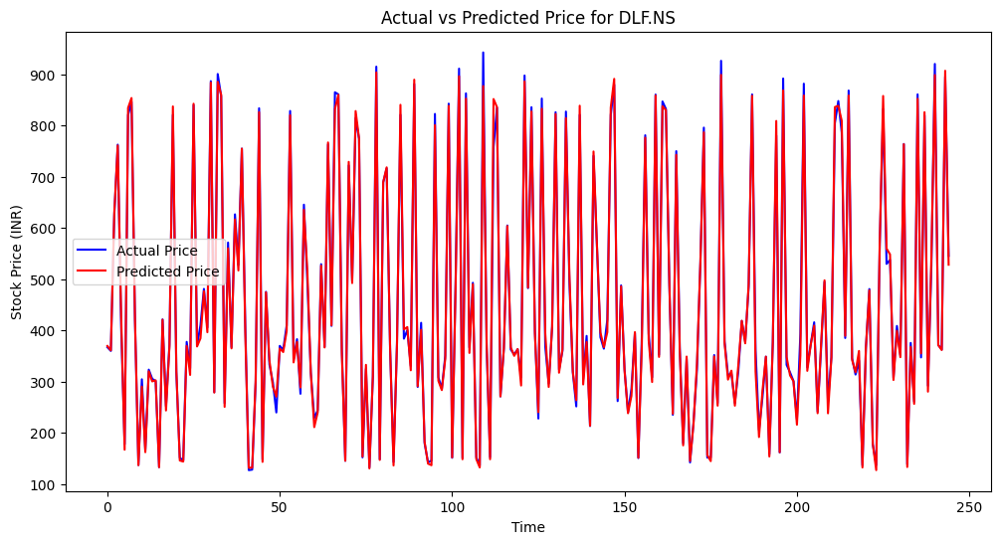


Processing ADANIENT.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0627 - val_loss: 0.0018
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0014 - val_loss: 0.0018
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 9.4851e-04 - val_loss: 0.0014
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 9.4756e-04 - val_loss: 0.0021
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0012 - val_loss: 0.0015
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0010 - val_loss: 0.0012
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 7.9691e-04 - val_loss: 0.0018
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0011 - val_loss: 0.0015
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step
ADANIENT.NS - MAE: 47.87760861527238, MSE: 10507.215288494595, RMSE: 102.50470861621234, R2 Score: 

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


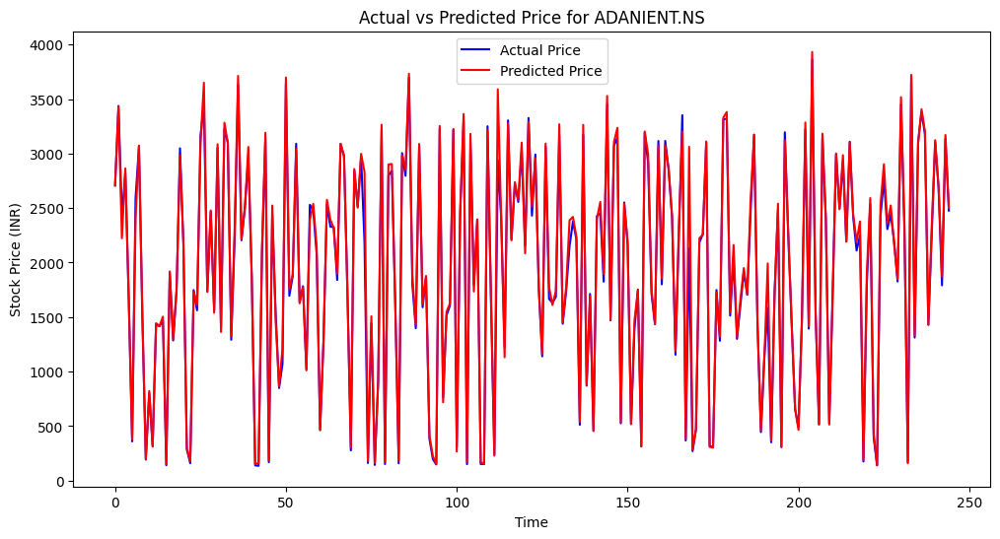


Processing GAIL.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0260 - val_loss: 0.0010
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0012 - val_loss: 5.5377e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 6.3124e-04 - val_loss: 7.6930e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 6.8940e-04 - val_loss: 5.3860e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.9498e-04 - val_loss: 8.7938e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 6.4104e-04 - val_loss: 5.5025e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 6.0335e-04 - val_loss: 4.8343e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 5.9610e-04 - val_loss: 4.0608e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 5.5322e-04 - val_loss: 3.6117e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 6.3850e-04 - val_loss: 4.4720e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
GAIL.NS - MAE: 1.9613059129380825, MSE: 10.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


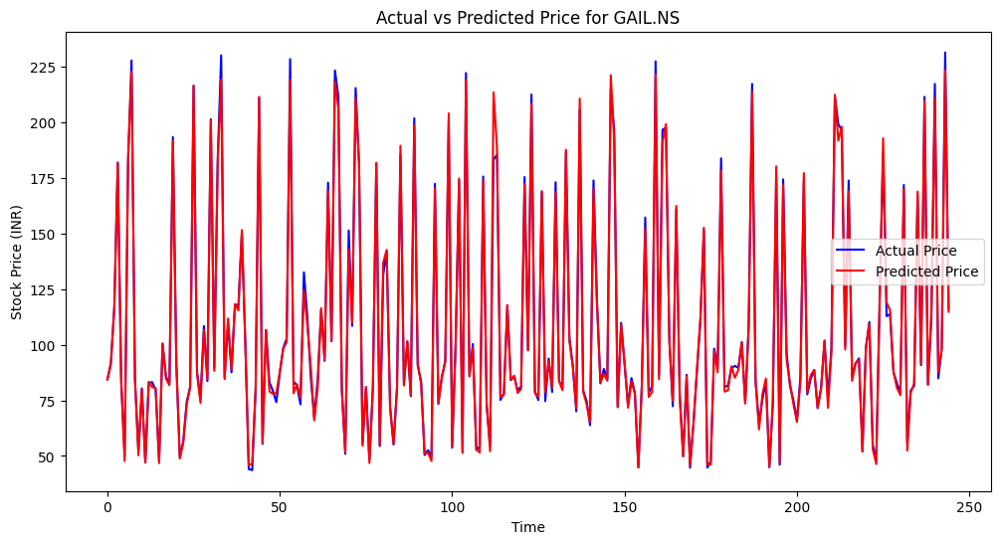


Processing AMBUJACEM.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0460 - val_loss: 0.0016
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0013 - val_loss: 0.0014
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0011 - val_loss: 0.0019
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 9.5400e-04 - val_loss: 0.0018
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0010 - val_loss: 0.0011
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.0846e-04 - val_loss: 9.8805e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 6.4308e-04 - val_loss: 9.2110e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.6161e-04 - val_loss: 0.0015
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 9.5526e-04 - val_loss: 0.0011
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step
AMBUJACEM.NS - MAE: 7.034100962284034, MSE: 125.91051352089826, RMSE: 11.2209854077

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


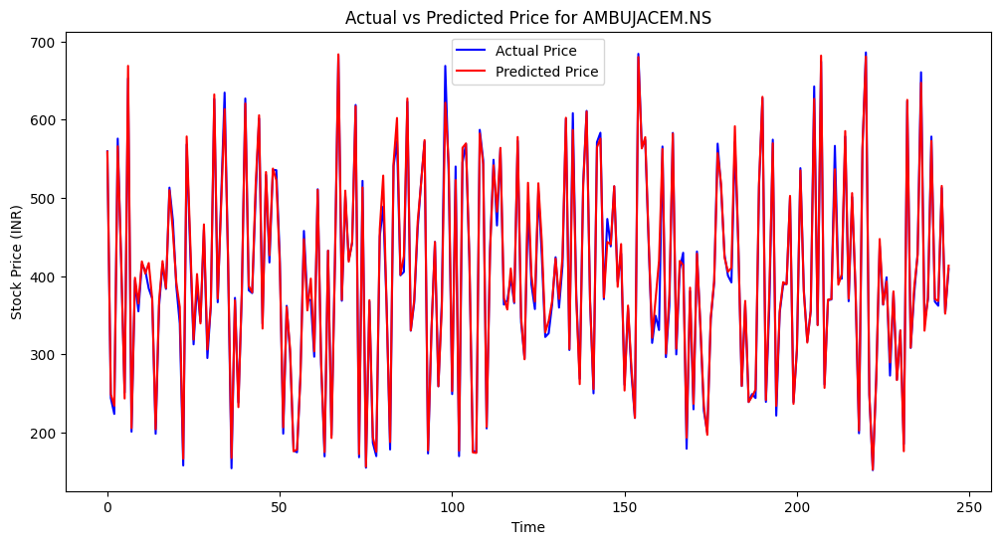


Processing VEDL.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - loss: 0.0826 - val_loss: 8.3003e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 8.3678e-04 - val_loss: 6.0289e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 5.4462e-04 - val_loss: 4.3010e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.3205e-04 - val_loss: 5.1377e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 4.1709e-04 - val_loss: 3.9244e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 4.6877e-04 - val_loss: 5.1332e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.2442e-04 - val_loss: 5.1651e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.2964e-04 - val_loss: 9.9303e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 5.7974e-04 - val_loss: 3.6998e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 4.3856e-04 - val_loss: 3.6515e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step
VEDL.NS - MAE: 4.114012002568223, M

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


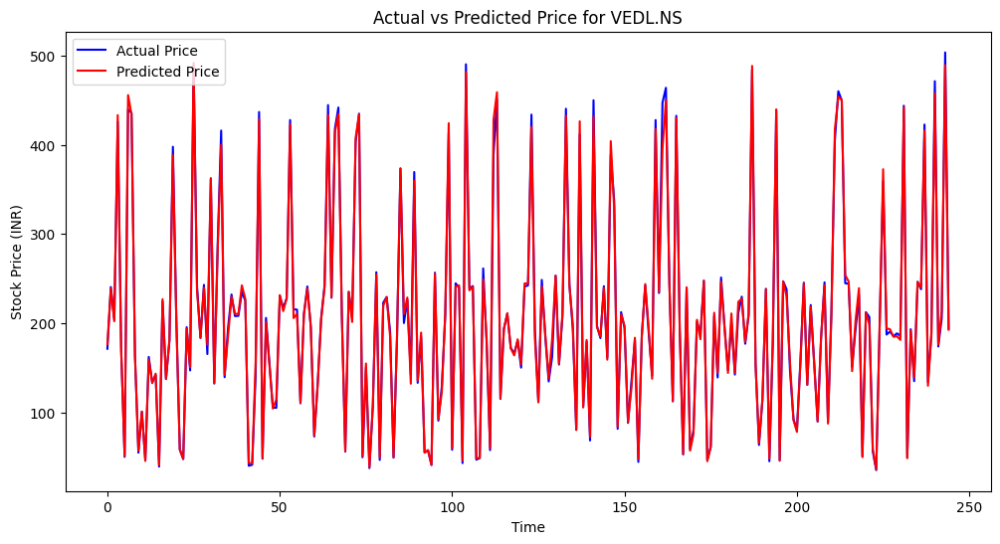


Processing PIDILITIND.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0599 - val_loss: 0.0016
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0011 - val_loss: 7.8596e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 9.9808e-04 - val_loss: 0.0013
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0010 - val_loss: 5.8630e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 8.2695e-04 - val_loss: 6.0171e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 7.2080e-04 - val_loss: 0.0011
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.6053e-04 - val_loss: 6.1046e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 6.7479e-04 - val_loss: 8.1264e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 7.8285e-04 - val_loss: 6.9776e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.2110e-04 - val_loss: 4.8880e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step
PIDILITIND.NS - MAE: 25.08276712192356, MSE: 1070.98396

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


Predicted Closing Price for PIDILITIND.NS on Next Trading Day: ₹2788.18


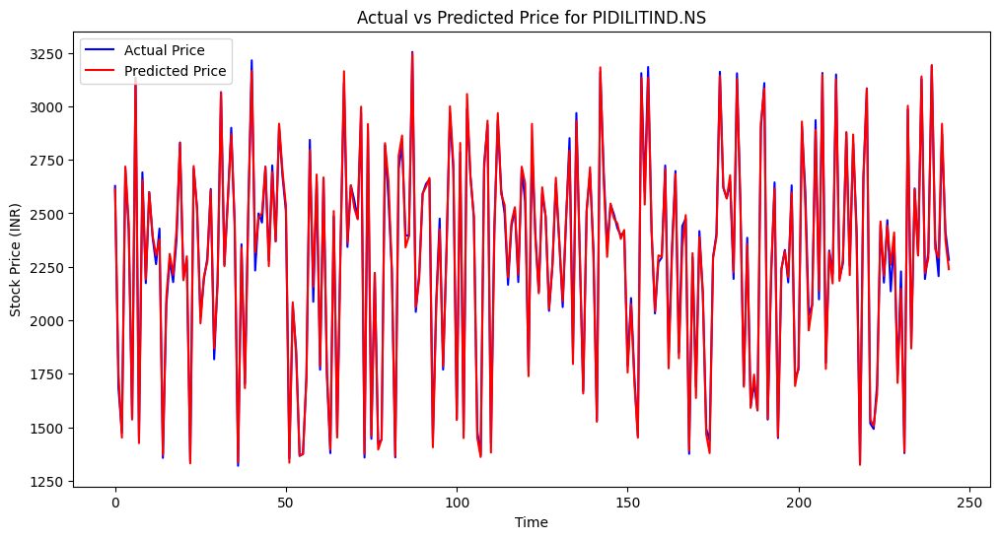


Processing GODREJCP.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0455 - val_loss: 0.0012
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0013 - val_loss: 7.5024e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 8.2188e-04 - val_loss: 0.0014
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 8.4981e-04 - val_loss: 9.2930e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 8.2294e-04 - val_loss: 5.0407e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.4130e-04 - val_loss: 4.9863e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 7.2612e-04 - val_loss: 9.2184e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 8.1102e-04 - val_loss: 0.0011
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.3601e-04 - val_loss: 4.8396e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 7.0141e-04 - val_loss: 0.0016
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step
GODREJCP.NS - MAE: 16.225391901934874, MSE: 463.3347813

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


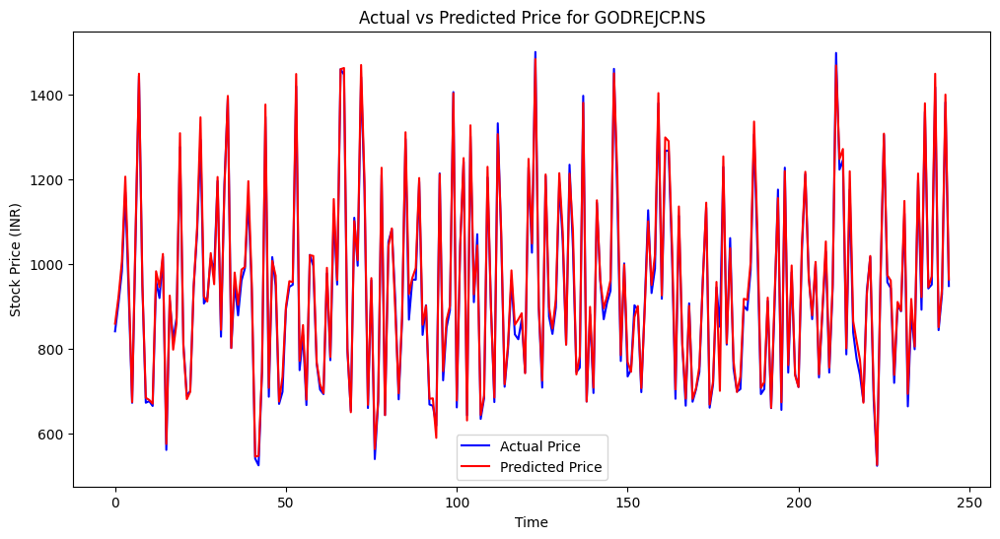


Processing YESBANK.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0115 - val_loss: 9.0702e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0017 - val_loss: 6.5797e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0019 - val_loss: 7.2290e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0016 - val_loss: 5.7020e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0016 - val_loss: 6.2870e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0013 - val_loss: 7.9364e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.2701e-04 - val_loss: 0.0062
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0029 - val_loss: 9.7360e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0020 - val_loss: 7.5453e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step
YESBANK.NS - MAE: 0.49139077328072467, MSE: 0.47700080139622725, RMSE: 0.69

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


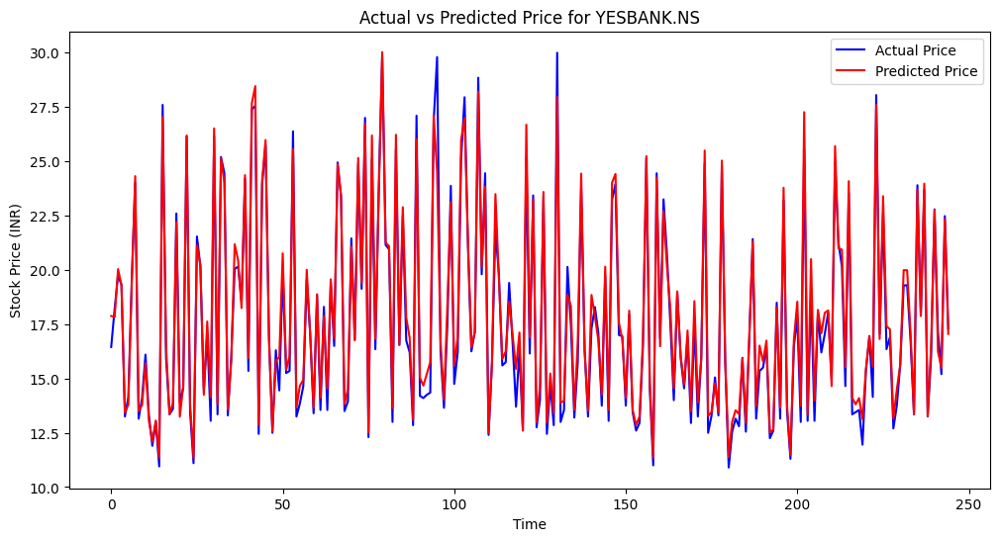


Processing INDIGO.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - loss: 0.0286 - val_loss: 0.0015
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 0.0010 - val_loss: 0.0011
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 8.5065e-04 - val_loss: 4.4188e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.8837e-04 - val_loss: 4.5369e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 5.2150e-04 - val_loss: 4.6269e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 7.2833e-04 - val_loss: 4.3187e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 4.0292e-04 - val_loss: 4.8511e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.3895e-04 - val_loss: 5.7944e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 4.9291e-04 - val_loss: 0.0013
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.4381e-04 - val_loss: 3.7510e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step
INDIGO.NS - MAE: 38.647406229730606, MSE: 3162.4639

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


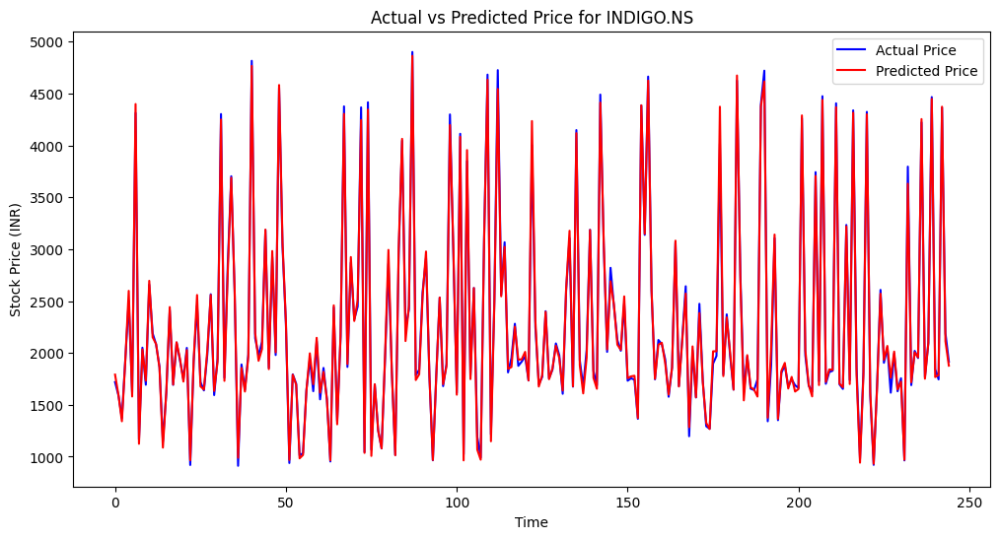


Processing TATAPOWER.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1096 - val_loss: 0.0040
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0019 - val_loss: 6.1423e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 7.2586e-04 - val_loss: 4.8464e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 5.9211e-04 - val_loss: 5.4984e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.3125e-04 - val_loss: 6.0959e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 8.4216e-04 - val_loss: 8.1678e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 6.3147e-04 - val_loss: 4.1034e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 4.6967e-04 - val_loss: 3.3232e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.4800e-04 - val_loss: 2.6886e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 3.8250e-04 - val_loss: 3.0606e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step
TATAPOWER.NS - MAE: 3.889226207897982, MSE:

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


Predicted Closing Price for TATAPOWER.NS on Next Trading Day: ₹344.71


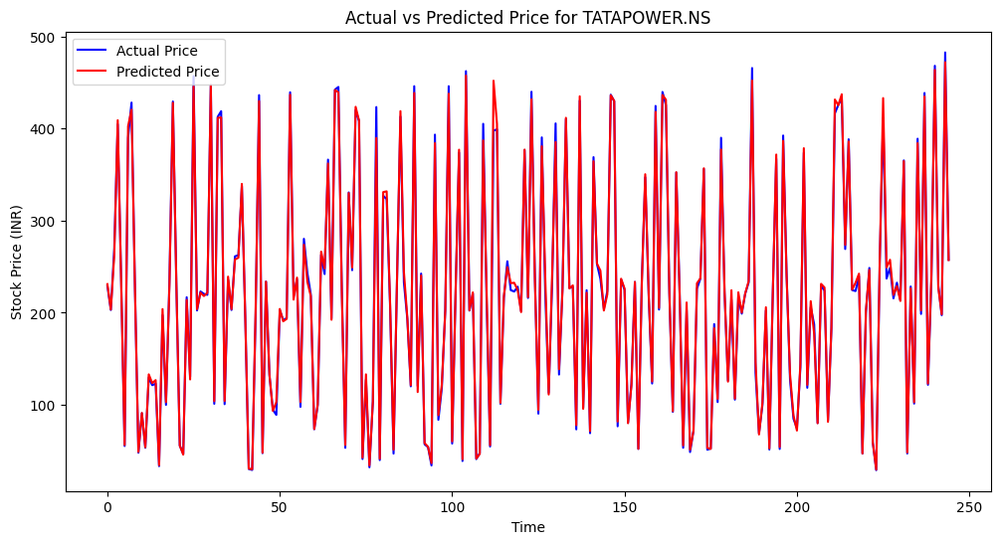


Processing BANKBARODA.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 0.0497 - val_loss: 7.5323e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 7.5450e-04 - val_loss: 4.7155e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 7.5886e-04 - val_loss: 4.6225e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 4.8957e-04 - val_loss: 6.3785e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.5588e-04 - val_loss: 0.0023
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0014 - val_loss: 6.1583e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 4.1791e-04 - val_loss: 5.7174e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 3.6648e-04 - val_loss: 4.0897e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.9672e-04 - val_loss: 0.0017
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 8.3499e-04 - val_loss: 4.2874e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step
BANKBARODA.NS - MAE: 2.85230669213424, MSE: 16.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


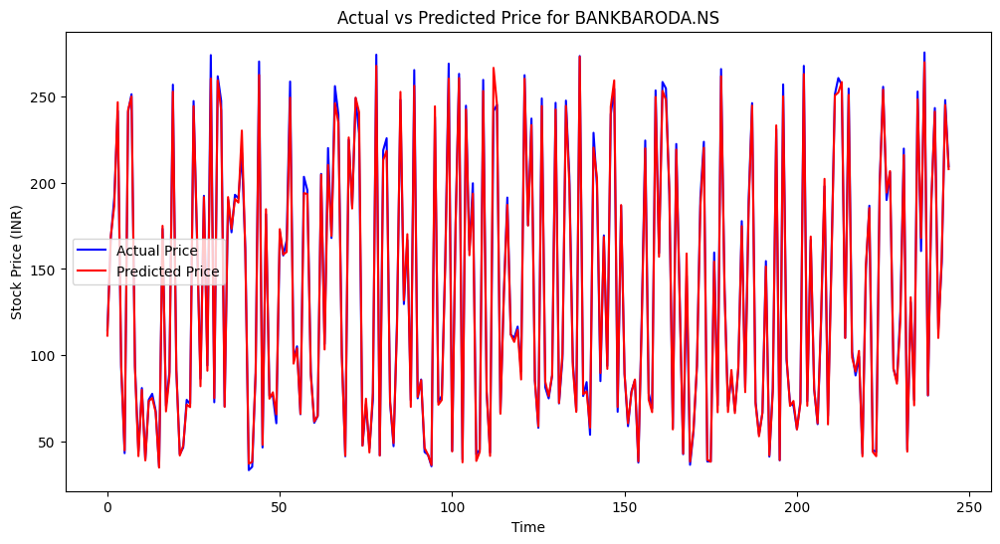


Processing PNB.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.0547 - val_loss: 0.0014
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0010 - val_loss: 7.2070e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.9714e-04 - val_loss: 9.5786e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 7.2604e-04 - val_loss: 7.1973e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 7.2701e-04 - val_loss: 6.4108e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 6.0458e-04 - val_loss: 6.9538e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.6797e-04 - val_loss: 0.0012
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0011 - val_loss: 6.2716e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 4.7689e-04 - val_loss: 0.0010
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 6.6211e-04 - val_loss: 4.7951e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step
PNB.NS - MAE: 1.2016055875717042, MSE: 3.66955522221523

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


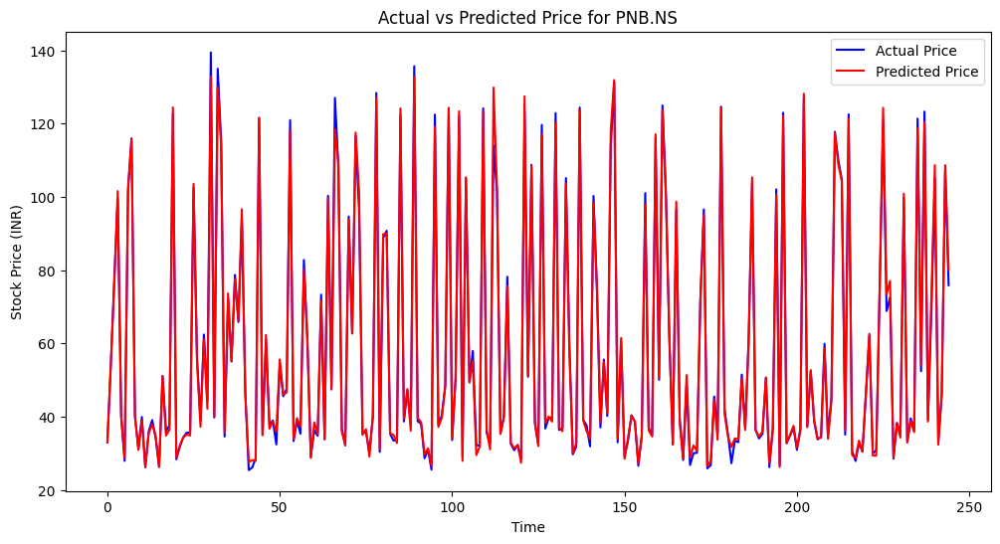


Processing BIOCON.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - loss: 0.0542 - val_loss: 0.0023
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0023 - val_loss: 0.0022
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0024 - val_loss: 0.0022
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0021 - val_loss: 0.0017
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0022 - val_loss: 0.0017
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0019 - val_loss: 0.0022
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0022 - val_loss: 0.0016
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0013 - val_loss: 0.0013
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step
BIOCON.NS - MAE: 5.520214688266917, MSE: 65.93821913873647, RMSE: 8.120235165236071, R2 Score: 0.98401910672623

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


Predicted Closing Price for BIOCON.NS on Next Trading Day: ₹352.38


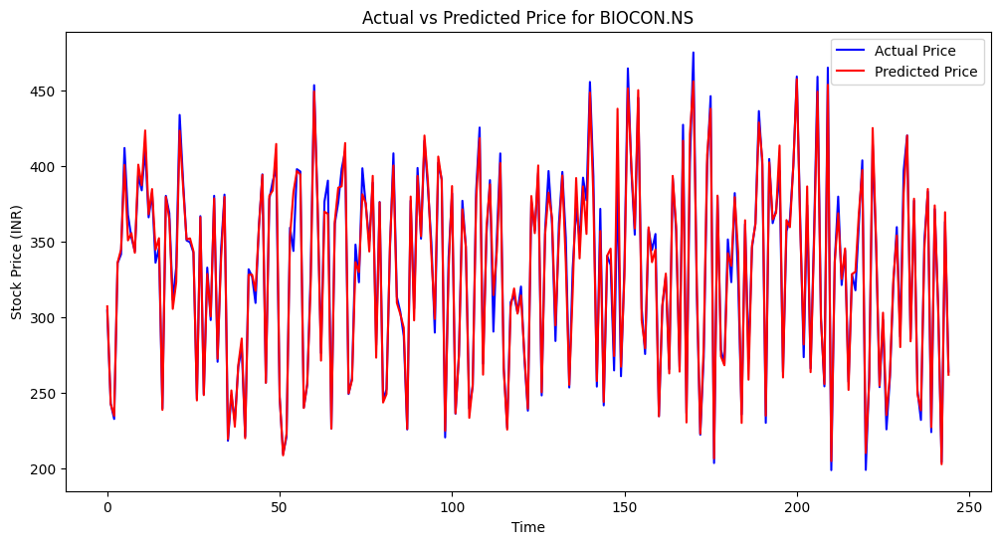


Processing LUPIN.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0466 - val_loss: 6.6201e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 7.8262e-04 - val_loss: 4.5808e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.0564e-04 - val_loss: 3.5760e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.0792e-04 - val_loss: 8.0394e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.2854e-04 - val_loss: 5.4023e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 5.5146e-04 - val_loss: 4.1538e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 6.1342e-04 - val_loss: 3.1071e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.0666e-04 - val_loss: 4.6389e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 5.1083e-04 - val_loss: 3.0526e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 6.2965e-04 - val_loss: 6.4574e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step
LUPIN.NS - MAE: 18.987974031522068,

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


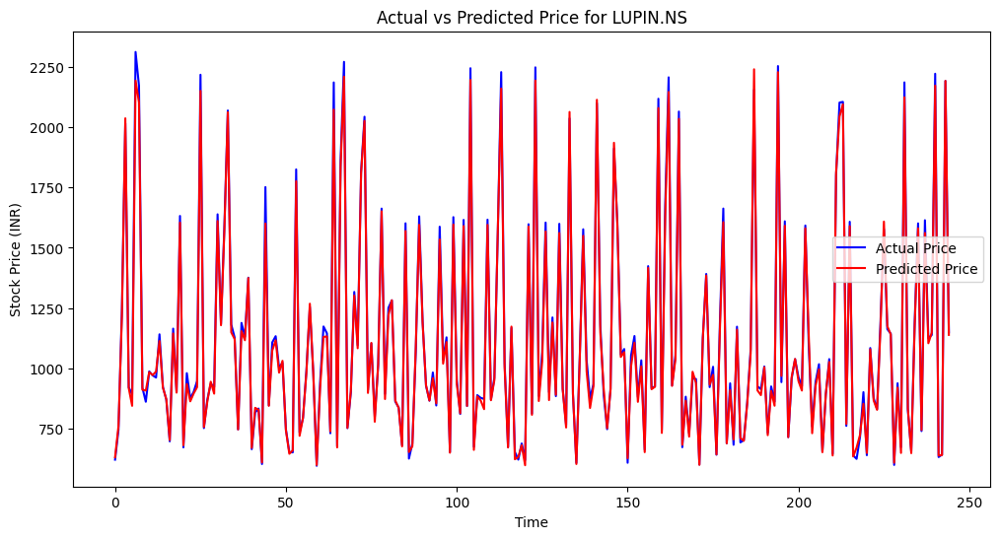


Processing ZEEL.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.0445 - val_loss: 0.0032
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0031 - val_loss: 0.0029
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0023 - val_loss: 0.0024
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0022 - val_loss: 0.0023
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0023 - val_loss: 0.0034
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0015 - val_loss: 0.0018
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0017 - val_loss: 0.0023
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
ZEEL.NS - MAE: 5.695757257502112, MSE: 91.82697713199285, RMSE: 9.582639361469932, R2 Score: 0.9705634202482368

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


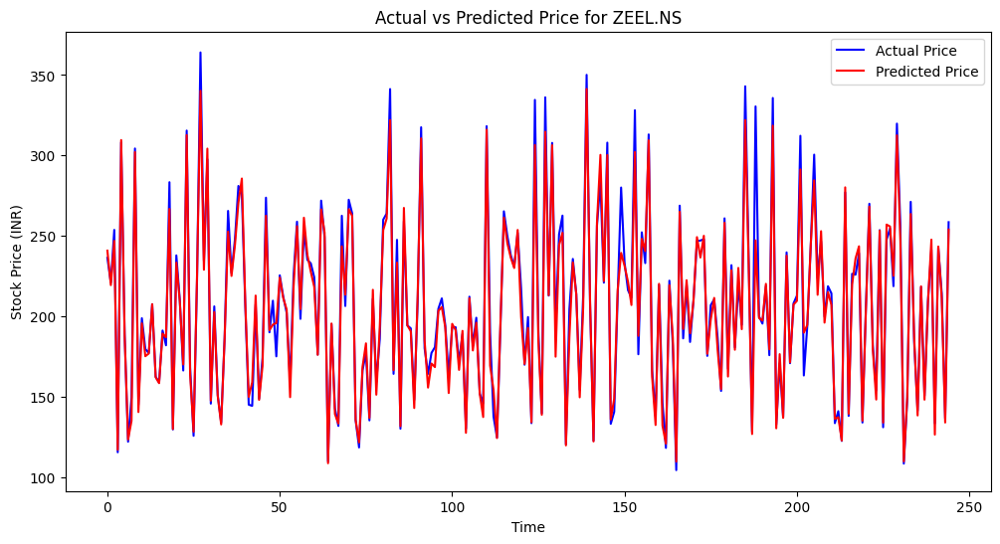


Processing BOSCHLTD.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0466 - val_loss: 0.0019
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 7.5104e-04 - val_loss: 8.4194e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 6.8125e-04 - val_loss: 3.5924e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 3.7516e-04 - val_loss: 4.0792e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 3.8428e-04 - val_loss: 6.2826e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 4.3886e-04 - val_loss: 3.8396e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 7.3164e-04 - val_loss: 0.0011
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.3909e-04 - val_loss: 5.6900e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 4.2631e-04 - val_loss: 8.2897e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.0041e-04 - val_loss: 4.1467e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step
BOSCHLTD.NS - MAE: 283.87594885461743, MSE

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


Predicted Closing Price for BOSCHLTD.NS on Next Trading Day: ₹27043.26


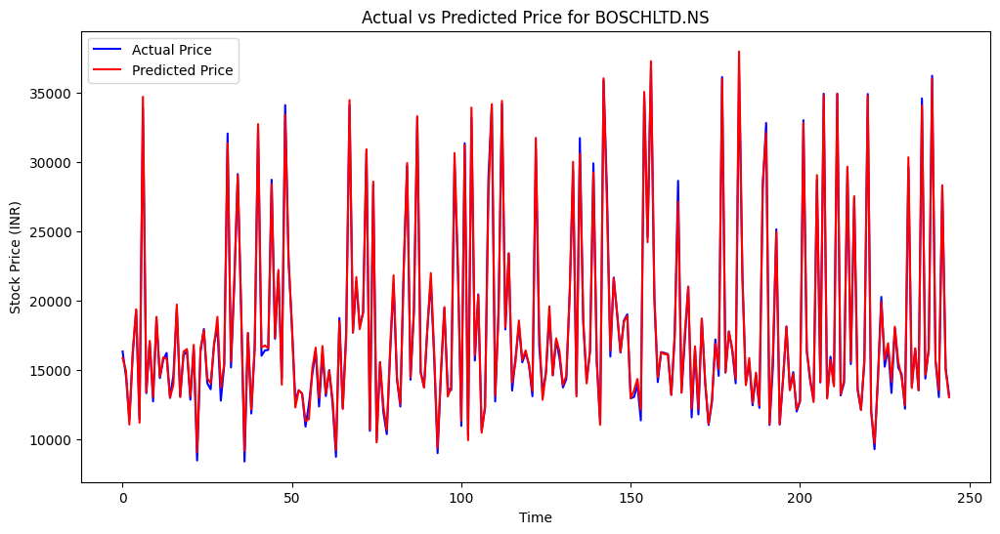


Processing AUBANK.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0676 - val_loss: 0.0022
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0029 - val_loss: 0.0018
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0031 - val_loss: 0.0019
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0018 - val_loss: 0.0012
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0014 - val_loss: 0.0011
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0013 - val_loss: 0.0015
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0014 - val_loss: 9.7286e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0012 - val_loss: 9.9232e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step
AUBANK.NS - MAE: 10.08545286754388, MSE: 211.57617793237566, RMSE: 14.545658387724346, R2 Score: 0.9867

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


Predicted Closing Price for AUBANK.NS on Next Trading Day: ₹532.89


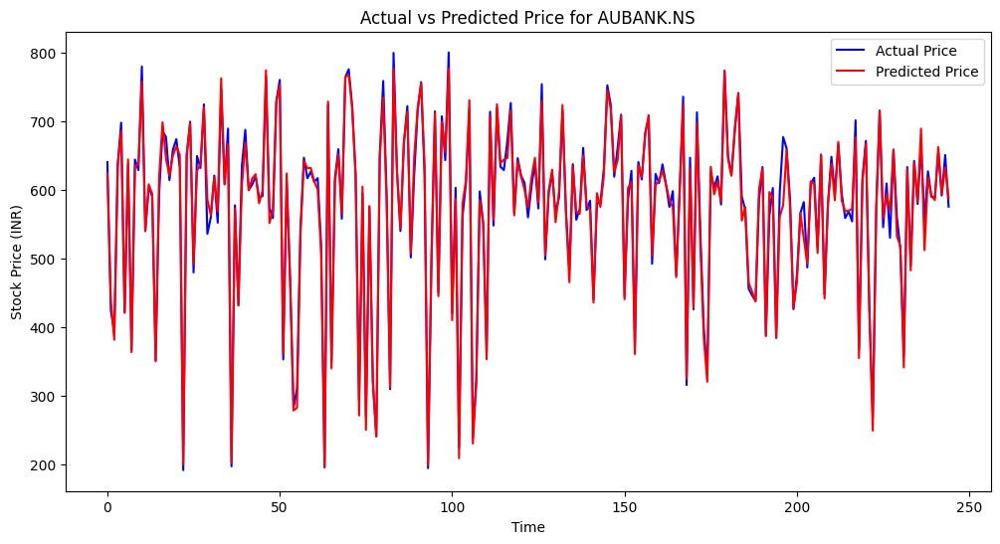


Processing COLPAL.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0431 - val_loss: 8.7516e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 7.5306e-04 - val_loss: 2.9389e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 5.1306e-04 - val_loss: 6.1944e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 6.9203e-04 - val_loss: 4.5039e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.0827e-04 - val_loss: 1.9173e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 2.9518e-04 - val_loss: 2.2531e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 3.9535e-04 - val_loss: 1.6750e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 2.6385e-04 - val_loss: 4.4875e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 3.2247e-04 - val_loss: 3.0853e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 3.0941e-04 - val_loss: 2.7677e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step
COLPAL.NS - MAE: 22.360973505936805

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


Predicted Closing Price for COLPAL.NS on Next Trading Day: ₹2483.61


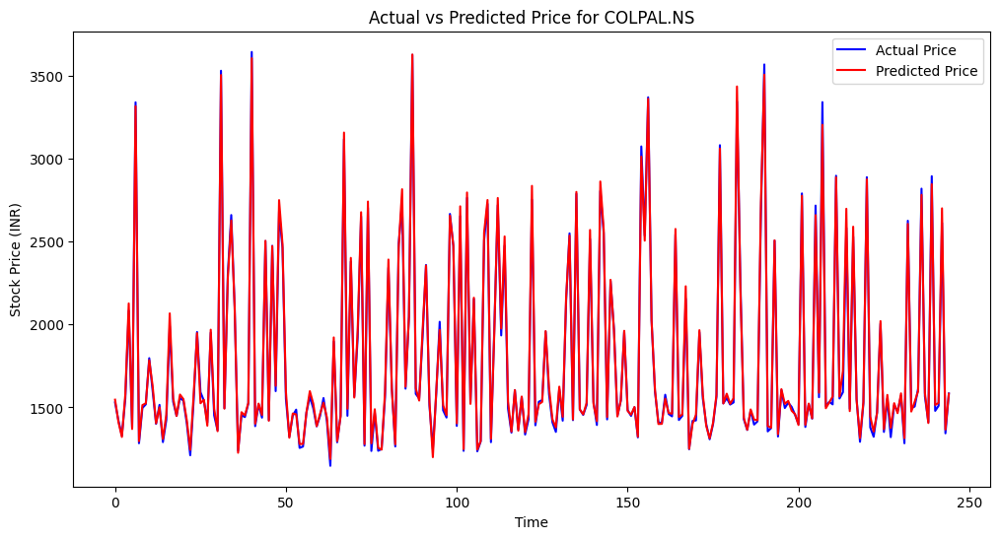


Processing TORNTPHARM.NS...


Device set to use cpu


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 0.0244 - val_loss: 3.9216e-04
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 4.9493e-04 - val_loss: 2.8229e-04
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 3.9359e-04 - val_loss: 2.6888e-04
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 3.2639e-04 - val_loss: 2.5281e-04
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 3.8040e-04 - val_loss: 5.6606e-04
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 3.8097e-04 - val_loss: 3.2578e-04
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 2.9694e-04 - val_loss: 4.9230e-04
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 3.5145e-04 - val_loss: 3.2149e-04
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 3.6565e-04 - val_loss: 2.3786e-04
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 3.8679e-04 - val_loss: 2.9774e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step
TORNTPHARM.NS - MAE: 22.05787796007

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


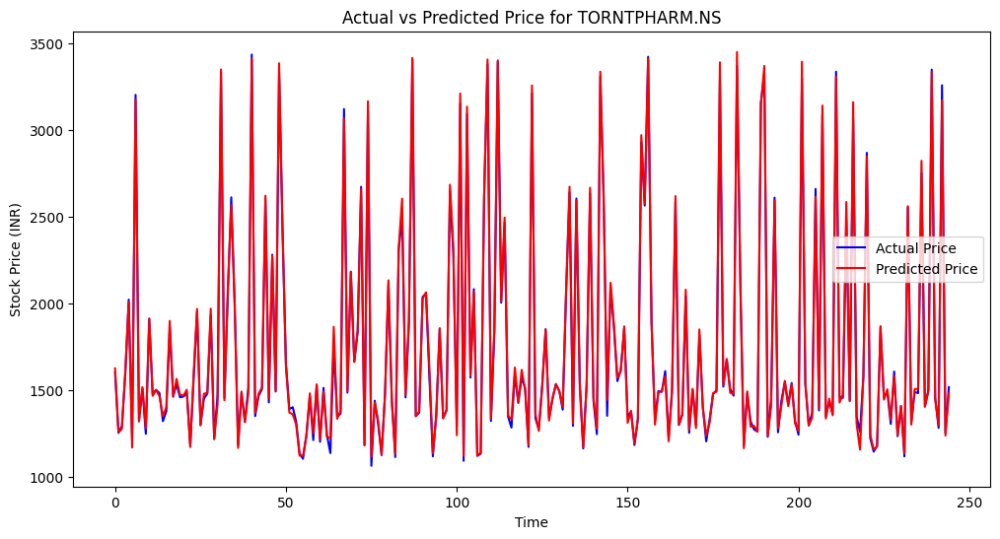


Processing ICICIPRULI.NS...


Device set to use cpu


In [ ]:
def main():
    tickers = ["RELIANCE.NS", "TCS.NS", "HDFCBANK.NS", "INFY.NS", "HINDUNILVR.NS", "ICICIBANK.NS", "BHARTIARTL.NS",
    "KOTAKBANK.NS", "ITC.NS", "SBIN.NS", "LT.NS", "AXISBANK.NS", "BAJFINANCE.NS", "ASIANPAINT.NS",
    "MARUTI.NS", "HCLTECH.NS", "WIPRO.NS", "M&M.NS", "ULTRACEMCO.NS", "NESTLEIND.NS", "SUNPHARMA.NS",
    "TITAN.NS", "BAJAJFINSV.NS", "TATASTEEL.NS", "POWERGRID.NS", "NTPC.NS", "DIVISLAB.NS", "JSWSTEEL.NS",
    "TECHM.NS", "BAJAJ-AUTO.NS", "ADANIPORTS.NS", "GRASIM.NS", "HINDALCO.NS", "TATAMOTORS.NS", "ONGC.NS",
    "BRITANNIA.NS", "CIPLA.NS", "SHREECEM.NS", "EICHERMOT.NS", "HEROMOTOCO.NS", "DRREDDY.NS", "SBILIFE.NS",
    "INDUSINDBK.NS", "TATACONSUM.NS", "BPCL.NS", "HDFCLIFE.NS", "ICICIGI.NS", "SBICARD.NS", "DLF.NS",
    "ADANIENT.NS", "GAIL.NS", "AMBUJACEM.NS", "VEDL.NS", "PIDILITIND.NS", "GODREJCP.NS", "YESBANK.NS",
    "INDIGO.NS", "TATAPOWER.NS", "BANKBARODA.NS", "PNB.NS", "BIOCON.NS", "LUPIN.NS", "ZEEL.NS",
    "BOSCHLTD.NS", "AUBANK.NS", "COLPAL.NS", "TORNTPHARM.NS", "ICICIPRULI.NS", "SIEMENS.NS", "PAGEIND.NS",
    "PETRONET.NS", "LICHSGFIN.NS", "BEL.NS", "LTTS.NS", "IGL.NS", "MRF.NS", "ABB.NS", "BANDHANBNK.NS",
    "CONCOR.NS", "RECLTD.NS", "NHPC.NS", "EXIDEIND.NS", "TATACHEM.NS", "ABCAPITAL.NS", "GICRE.NS",
    "NIACL.NS"]

    results = []

    for ticker in tickers:
        print(f"\nProcessing {ticker}...")

        data = get_stock_data(ticker)
        sentiment_score = get_news_sentiment(ticker)

        time_step = 15
        X, Y, scaler = prepare_data(data, sentiment_score, time_step)

        X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

        Y_train, Y_test = Y_train.flatten(), Y_test.flatten()

        # Train LSTM
        lstm_model = build_lstm_model(time_step, X.shape[2])
        lstm_model.fit(X_train, Y_train, epochs=10, batch_size=16, verbose=1, validation_data=(X_test, Y_test))

        # Train XGBoost and RandomForest
        X_train_2d = X_train.reshape(X_train.shape[0], -1)
        X_test_2d = X_test.reshape(X_test.shape[0], -1)

        xgb_model = XGBRegressor(n_estimators=200, learning_rate=0.05)
        xgb_model.fit(X_train_2d, Y_train)

        rf_model = RandomForestRegressor(n_estimators=200)
        rf_model.fit(X_train_2d, Y_train)

        # Compute predictions
        lstm_predictions = lstm_model.predict(X_test).flatten()
        xgb_predictions = xgb_model.predict(X_test_2d)
        rf_predictions = rf_model.predict(X_test_2d)

        # Aggregate predictions
        final_predictions = (lstm_predictions + xgb_predictions + rf_predictions) / 3

        # **INVERSE TRANSFORMATION TO ORIGINAL PRICES**
        actual_prices = scaler.inverse_transform(np.hstack([Y_test.reshape(-1, 1), np.zeros((len(Y_test), 4))]))[:, 0]
        predicted_prices = scaler.inverse_transform(np.hstack([final_predictions.reshape(-1, 1), np.zeros((len(final_predictions), 4))]))[:, 0]

        # Performance metrics
        mae = mean_absolute_error(actual_prices, predicted_prices)
        mse = mean_squared_error(actual_prices, predicted_prices)
        rmse = np.sqrt(mse)
        r2 = r2_score(actual_prices, predicted_prices)

        print(f"{ticker} - MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R2 Score: {r2}")

        # **Predict Next Day Price**
        recent_data = data.iloc[-time_step:][['Close', 'RSI', 'Stochastic', 'ROC', 'ADX']].values
        recent_scaled = scaler.transform(recent_data)
        next_day_input = np.hstack([recent_scaled, np.full((time_step, 1), sentiment_score)])

        lstm_next_day = lstm_model.predict(next_day_input[np.newaxis, :, :]).flatten()
        xgb_next_day = xgb_model.predict(next_day_input.flatten().reshape(1, -1))
        rf_next_day = rf_model.predict(next_day_input.flatten().reshape(1, -1))

        final_next_day_prediction = (lstm_next_day + xgb_next_day + rf_next_day) / 3

        # Convert next day prediction back to real price
        next_day_price = scaler.inverse_transform(
            np.hstack([final_next_day_prediction.reshape(-1, 1), np.zeros((1, 4))])
        )[:, 0][0]

        print(f"Predicted Closing Price for {ticker} on Next Trading Day: ₹{next_day_price:.2f}")

        # Plot actual vs predicted prices (Corrected Scale)
        plt.figure(figsize=(12, 6))
        plt.plot(actual_prices, label="Actual Price", color="blue")
        plt.plot(predicted_prices, label="Predicted Price", color="red")
        plt.title(f"Actual vs Predicted Price for {ticker}")
        plt.xlabel("Time")
        plt.ylabel("Stock Price (INR)")
        plt.legend()
        plt.show()

if __name__ == "__main__":
    main()
